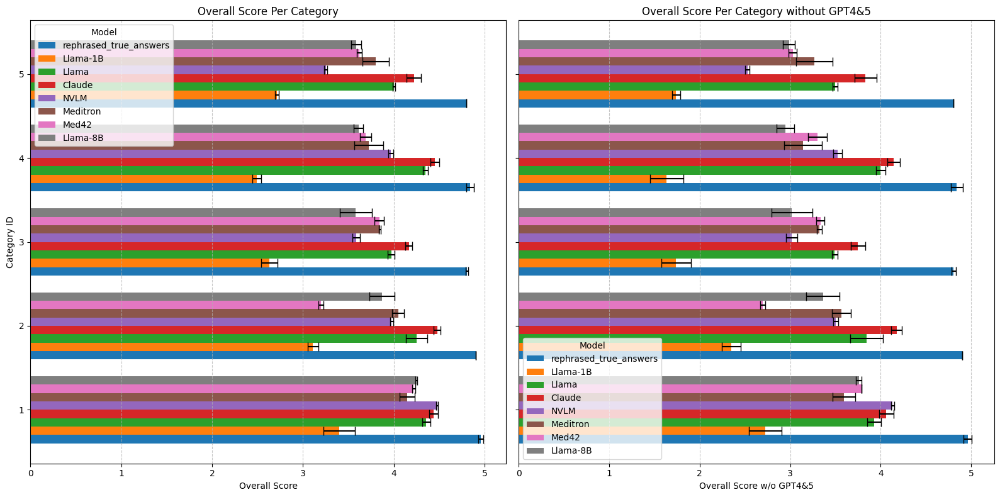

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the CSV file
#df = pd.read_csv('/Users/gonuni/Desktop/College/CBB/HIV_LLMs/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')
df = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv')

df_rephrased_first = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')
#df_rephrased_first.rename(columns={'model': 'subfolder'}, inplace=True)

df = df[df['category_id'] != 6]
df_rephrased_first = df_rephrased_first[df_rephrased_first['category_id'] != 6]

# Group by 'category_id' and 'model', and calculate the mean and std
grouped_rephrased = df_rephrased_first.groupby(['category_id', 'model']).agg({
    'GPT_overall_score_mean': 'mean',
    'GPT_overall_score_std': 'mean',
    'GPT_overall_score_wo_Q4&5_mean': 'mean',
    'GPT_overall_score_wo_Q4&5_std': 'mean'
}).reset_index()


grouped = df.groupby(['category_id', 'model']).agg({
    'GPT_overall_score_mean': 'mean',
    'GPT_overall_score_std': 'mean',
    'GPT_overall_score_wo_Q4&5_mean': 'mean',
    'GPT_overall_score_wo_Q4&5_std': 'mean'
}).reset_index()

grouped = pd.concat([grouped_rephrased, grouped], ignore_index=True).sort_values(by= 'category_id')

# Get unique categories and models
categories = grouped['category_id'].unique()
models = grouped['model'].unique()
n_categories = len(categories)
n_models = len(models)


# Calculate bar heights and positions
bar_height = 0.8 / n_models  # Total bar height divided among models
y_positions = np.arange(n_categories)

# Create a figure with two subplots (1 row, 2 columns)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1: Overall scores
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped[grouped['model'] == model]
    # Map category IDs to y positions
    y_offsets = y_positions - 0.4 + i * bar_height + bar_height / 2
    # Get means and standard deviations
    means = model_data['GPT_overall_score_mean']
    stds = model_data['GPT_overall_score_std']
    if model == 'rephrased_true_answers':
        means = model_data['GPT_overall_score_mean']
    # Plot horizontal bars
    ax1.barh(y_offsets, means, height=bar_height, xerr=stds, align='center', label=model, capsize=5)

ax1.set_yticks(y_positions)
ax1.set_yticklabels(categories)
ax1.set_xlabel('Overall Score')
ax1.set_ylabel('Category ID')
ax1.set_title('Overall Score Per Category')
ax1.legend(title='Model')
ax1.grid(axis='x', linestyle='--', alpha=0.7)

# Plot 2: Overall scores without Q4&5
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped[grouped['model'] == model]
    # Map category IDs to y positions
    y_offsets = y_positions - 0.4 + i * bar_height + bar_height / 2
    # Get means and standard deviations
    means = model_data['GPT_overall_score_wo_Q4&5_mean']
    stds = model_data['GPT_overall_score_wo_Q4&5_std']
    # Plot horizontal bars
    if model == 'rephrased_true_answers':
        means = model_data['GPT_overall_score_mean']
    ax2.barh(y_offsets, means, height=bar_height, xerr=stds, align='center', label=model, capsize=5)

ax2.set_yticks(y_positions)
ax2.set_yticklabels([])  # Remove y-axis labels on the second plot
ax2.set_xlabel('Overall Score w/o GPT4&5')
ax2.set_title('Overall Score Per Category without GPT4&5')
ax2.legend(title='Model')
ax2.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust the layout to avoid overlap
plt.tight_layout()
plt.savefig('updated_gpt_score_with_pipeline_100_score_01.jpg')
plt.show()

In [3]:
df_rephrased_first = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')
df_rephrased_first.rename(columns={'model': 'subfolder'}, inplace=True)

grouped_rephrased = df_rephrased_first.groupby(['category_id', 'subfolder']).agg({
    'GPT_overall_score_mean': 'mean',
    'GPT_overall_score_std': 'mean',
    'GPT_overall_score_wo_Q4&5_mean': 'mean',
    'GPT_overall_score_wo_Q4&5_std': 'mean'
}).reset_index()

#means = model_data['GPT_overall_score_mean']
grouped_rephrased

,category_id,subfolder,GPT_overall_score_mean,GPT_overall_score_std,GPT_overall_score_wo_Q4&5_mean,GPT_overall_score_wo_Q4&5_std
0,1,rephrased_true_answers,4.960000,0.026968,4.933333,0.044947
1,2,rephrased_true_answers,4.900000,0.000000,4.833333,0.000000
2,3,rephrased_true_answers,4.806667,0.014907,4.691667,0.024845
3,4,rephrased_true_answers,4.840000,0.039417,4.733333,0.065695
4,5,rephrased_true_answers,4.800000,0.000000,4.680556,0.000000
5,6,rephrased_true_answers,4.760000,0.014142,4.600000,0.023570


In [42]:
pd.concat([grouped_rephrased, grouped], ignore_index=True).sort_values(by= 'category_id')

,category_id,subfolder,GPT_overall_score_mean,GPT_overall_score_std,GPT_overall_score_wo_Q4&5_mean,GPT_overall_score_wo_Q4&5_std
0,1,rephrased_true_answers,4.986667,0.011547,4.977778,0.019245
7,1,Llama-1B,63.575758,2.811331,48.989899,3.718558
6,1,Claude,87.090909,0.721569,80.353535,1.008838
12,1,Meditron_api,79.090909,0.454545,68.434343,0.462886
11,1,Med42,81.715152,0.954906,74.525253,1.224682
10,1,Llama_cluster,86.212121,1.426819,79.494949,2.062685
9,1,Llama_api,85.424242,0.367405,78.282828,0.532104
8,1,Llama-8B,84.484848,1.013681,77.121212,1.461159
14,1,NVLM,88.360606,0.162708,82.808081,0.332414
13,1,Meditron_cluster,79.939394,1.907647,69.848485,2.838635


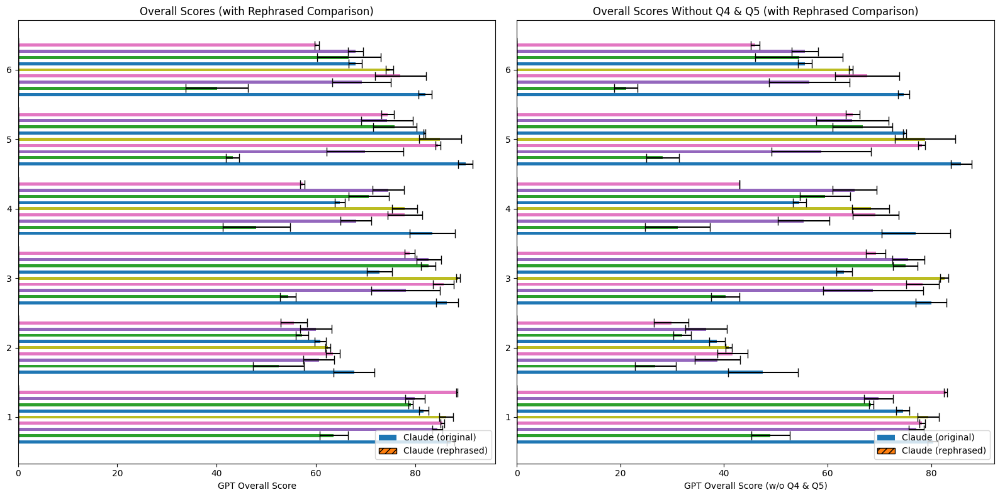

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------------------
# 1. READ CSVs & GROUP
# ---------------------------------------------------------------------------
#df = pd.read_csv('/Users/gonuni/Desktop/College/CBB/HIV_LLMs/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')
df = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv')

df_rephrased_first = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')
df_rephrased_first.rename(columns={'model': 'subfolder'}, inplace=True)


# Group both the original and rephrased DataFrames
grouped = df.groupby(['category_id', 'subfolder']).agg({
    'GPT_overall_score_mean': 'mean',
    'GPT_overall_score_std': 'mean',
    'GPT_overall_score_wo_Q4&5_mean': 'mean',
    'GPT_overall_score_wo_Q4&5_std': 'mean'
}).reset_index()

grouped_rephrased = df_rephrased_first.groupby(['category_id', 'subfolder']).agg({
    'GPT_overall_score_mean': 'mean',
    'GPT_overall_score_std': 'mean',
    'GPT_overall_score_wo_Q4&5_mean': 'mean',
    'GPT_overall_score_wo_Q4&5_std': 'mean'
}).reset_index()

# ---------------------------------------------------------------------------
# 2. GET CATEGORIES & MODELS
# ---------------------------------------------------------------------------
categories = grouped['category_id'].unique()
models = grouped['subfolder'].unique()
n_categories = len(categories)
n_models = len(models)

# Create an index map for categories -> integer positions
category_to_index = {cat_id: idx for idx, cat_id in enumerate(categories)}

# Y positions for the baseline (e.g. if you had 6 categories, you'd get [0,1,2,3,4,5])
y_positions = np.arange(n_categories)

# Bar height: let's split 0.8 among all models
bar_height = 0.8 / n_models

# ---------------------------------------------------------------------------
# 3. SET UP FIGURE & SUBPLOTS
# ---------------------------------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ---------------------------------------------------------------------------
# 4. FIRST SUBPLOT: OVERALL SCORES
# ---------------------------------------------------------------------------
for i, model in enumerate(models):
    # Filter for this model in original & rephrased
    model_data = grouped[grouped['subfolder'] == model].copy()
    model_data_rephrased = grouped_rephrased[grouped_rephrased['subfolder'] == model].copy()
    
    # Merge on category_id. 'left' keeps all rows from model_data, 
    # (change to 'inner' or 'outer' if desired).
    merged_df = pd.merge(
        model_data[['category_id','GPT_overall_score_mean','GPT_overall_score_std']],
        model_data_rephrased[['category_id','GPT_overall_score_mean','GPT_overall_score_std']],
        on='category_id',
        how='left',
        suffixes=('_orig','_rephr')
    )

    # Fill missing rows with 0 if they don't exist in the rephrased. 
    # Alternatively, you could drop them.
    merged_df.fillna(0, inplace=True)

    # Map category to the integer index
    cat_indices = merged_df['category_id'].map(category_to_index).values

    # Shift them in the y-direction so each model is stacked
    y_offsets = cat_indices - 0.4 + i * bar_height + bar_height / 2

    # Extract the columns for original and rephrased
    means_orig = merged_df['GPT_overall_score_mean_orig'].values
    stds_orig  = merged_df['GPT_overall_score_std_orig'].values
    means_rephr = merged_df['GPT_overall_score_mean_rephr'].values
    stds_rephr  = merged_df['GPT_overall_score_std_rephr'].values
    
    # Plot original bars
    ax1.barh(
        y_offsets,
        means_orig,
        height=bar_height/2,
        xerr=stds_orig,
        align='center',
        label=(f"{model} (original)" if i == 0 else ""),
        capsize=5
    )
    
    # Plot rephrased bars (shifted by bar_height/2 in the y-direction)
    ax1.barh(
        y_offsets + bar_height/2,
        means_rephr,
        height=bar_height/2,
        xerr=stds_rephr,
        align='center',
        label=(f"{model} (rephrased)" if i == 0 else ""),
        capsize=5,
        hatch='///',
        edgecolor='black'
    )

ax1.set_yticks(y_positions)
ax1.set_yticklabels(categories)
ax1.set_xlabel('GPT Overall Score')
ax1.set_title('Overall Scores (with Rephrased Comparison)')
ax1.legend(loc='lower right')

# ---------------------------------------------------------------------------
# 5. SECOND SUBPLOT: OVERALL SCORES w/o Q4 & Q5
# ---------------------------------------------------------------------------
for i, model in enumerate(models):
    # Filter for this model in original & rephrased
    model_data = grouped[grouped['subfolder'] == model].copy()
    model_data_rephrased = grouped_rephrased[grouped_rephrased['subfolder'] == model].copy()
    
    # Merge on category_id
    merged_df_wo = pd.merge(
        model_data[['category_id','GPT_overall_score_wo_Q4&5_mean','GPT_overall_score_wo_Q4&5_std']],
        model_data_rephrased[['category_id','GPT_overall_score_wo_Q4&5_mean','GPT_overall_score_wo_Q4&5_std']],
        on='category_id',
        how='left',
        suffixes=('_orig','_rephr')
    )
    
    # Fill missing rows (or drop them if you prefer)
    merged_df_wo.fillna(0, inplace=True)

    # Map category to integer index
    cat_indices_wo = merged_df_wo['category_id'].map(category_to_index).values
    
    # Shift them in the y-direction so each model is stacked
    y_offsets_wo = cat_indices_wo - 0.4 + i * bar_height + bar_height / 2

    # Extract the columns
    means_orig_wo = merged_df_wo['GPT_overall_score_wo_Q4&5_mean_orig'].values
    stds_orig_wo  = merged_df_wo['GPT_overall_score_wo_Q4&5_std_orig'].values
    means_rephr_wo = merged_df_wo['GPT_overall_score_wo_Q4&5_mean_rephr'].values
    stds_rephr_wo  = merged_df_wo['GPT_overall_score_wo_Q4&5_std_rephr'].values

    # Plot original bars
    ax2.barh(
        y_offsets_wo,
        means_orig_wo,
        height=bar_height/2,
        xerr=stds_orig_wo,
        align='center',
        label=(f"{model} (original)" if i == 0 else ""),
        capsize=5
    )

    # Plot rephrased bars
    ax2.barh(
        y_offsets_wo + bar_height/2,
        means_rephr_wo,
        height=bar_height/2,
        xerr=stds_rephr_wo,
        align='center',
        label=(f"{model} (rephrased)" if i == 0 else ""),
        capsize=5,
        hatch='///',
        edgecolor='black'
    )

ax2.set_yticks(y_positions)
ax2.set_yticklabels(categories)
ax2.set_xlabel('GPT Overall Score (w/o Q4 & Q5)')
ax2.set_title('Overall Scores Without Q4 & Q5 (with Rephrased Comparison)')
ax2.legend(loc='lower right')

# ---------------------------------------------------------------------------
# 6. FINAL LAYOUT & SHOW
# ---------------------------------------------------------------------------
plt.tight_layout()
plt.show()

In [35]:
merged_df_wo

,category_id,GPT_overall_score_wo_Q4&5_mean_orig,GPT_overall_score_wo_Q4&5_std_orig,GPT_overall_score_wo_Q4&5_mean_rephr,GPT_overall_score_wo_Q4&5_std_rephr
0,1,82.808081,0.332414,0.0,0.0
1,2,29.833333,3.329164,0.0,0.0
2,3,69.322391,1.881878,0.0,0.0
3,4,43.022222,0.019245,0.0,0.0
4,5,64.898990,1.314025,0.0,0.0
5,6,46.033333,0.876229,0.0,0.0


In [29]:
for i, model in enumerate(models):
    # Subset each DataFrame for this model
    orig_subset = grouped[grouped['subfolder'] == model].copy()
    reph_subset = grouped_rephrased[grouped_rephrased['subfolder'] == model].copy()

    # Merge on category_id
    merged = pd.merge(
        orig_subset,
        reph_subset[['category_id', 'GPT_overall_score_mean', 'GPT_overall_score_std']],
        on='category_id',
        how='left',  # or 'inner', depending on your preference
        suffixes=('', '_rephrased')
    )

    # Sort by category_id if needed
    merged = merged.sort_values('category_id').reset_index(drop=True)

    # Extract arrays
    original_means = merged['GPT_overall_score_mean'].values
    original_stds  = merged['GPT_overall_score_std'].values
    rephrased_means = merged['GPT_overall_score_mean_rephrased'].values
    rephrased_stds  = merged['GPT_overall_score_std_rephrased'].values

    # Now these arrays all have the same length = merged.shape[0].
    y_offsets = np.arange(len(merged)) - 0.4 + i * bar_height + bar_height/2

    # Plot original
    ax1.barh(y_offsets, original_means, height=bar_height, xerr=original_stds, ...)

    # Plot rephrased only if not all NaN
    if not np.isnan(rephrased_means).all():
        ax1.barh(y_offsets, rephrased_means, height=bar_height, xerr=rephrased_stds,
                 facecolor='none', edgecolor='black', hatch='///', capsize=5,
                 label='Rephrased' if i == 0 else None)

SyntaxError: positional argument follows keyword argument (3289108463.py, line 28)

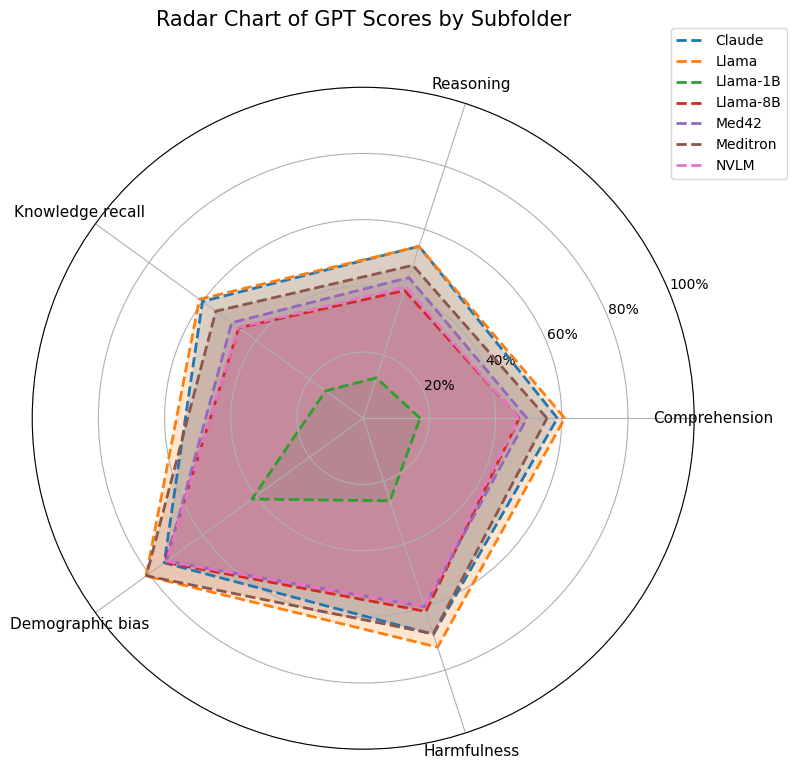

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# === 1) Load and preprocess the data ===
file_path = '/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv'
df = pd.read_csv(file_path)

# Group by 'subfolder' and compute the mean of the GPT scores
average_scores = df.groupby('model')[
    ['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']
].mean()
average_scores.reset_index(inplace=True)

# Extract subfolders (for naming each trace)
subfolders = average_scores['model']

# Extract the numeric scores as a 2D NumPy array
scores = average_scores[['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']].values

# Define your human-readable categories
categories = [
    'Comprehension', 
    'Reasoning', 
    'Knowledge recall', 
    'Demographic bias', 
    'Harmfulness'
]

# Number of categories
N = len(categories)

# === 2) Prepare the angles for the radar chart ===
# We make one angle per category, plus one angle repeated to close the circle
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
angles += angles[:1]  # repeat the first angle at the end to close the loop

# === 3) Create the radar chart ===
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Optionally, set radial (r-axis) limits and ticks if you know the data range
ax.set_ylim(0, 100)  # Adjust if your data are in a different range
ax.set_yticks([20, 40, 60, 80, 100])  # Adjust as needed
ax.set_yticklabels(['20%', '40%', '60%', '80%', '100%'])

# === 4) Plot one line per subfolder ===
for i, subfolder in enumerate(subfolders):
    # Grab the row of scores for this subfolder
    data = list(scores[i])
    # Repeat the first value to close the radar shape
    data += data[:1]

    # Plot and fill
    ax.plot(angles, data, linewidth=2, linestyle='dashed', label=subfolder)
    ax.fill(angles, data, alpha=0.2)

# === 5) Set up category labels around the circle ===
ax.set_xticks(angles[:-1])  # exclude the last angle (duplicate of the first)
ax.set_xticklabels(categories, fontsize=11)

# === 6) Add legend, title, and show the plot ===
ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1.1))
plt.title('Radar Chart of GPT Scores by Subfolder', size=15, y=1.08)
plt.tight_layout()  # helps ensure labels/titles fit within the figure
plt.show()

In [16]:
file_path = '/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv'  # Update this if needed
data = pd.read_csv(file_path)
data.columns

Index(['model', 'subfolder', 'category_id', 'question_index', 'num_iterations',
       'GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean',
       'GPT_overall_score_mean', 'GPT_overall_score_wo_Q4&5_mean', 'GPT1_std',
       'GPT2_std', 'GPT3_std', 'GPT4_std', 'GPT5_std', 'GPT_overall_score_std',
       'GPT_overall_score_wo_Q4&5_std', 'nlp_model', 'precision_mean',
       'precision_std', 'recall_mean', 'recall_std', 'f1_score_mean',
       'f1_score_std', 'synonyms_precision_dict_mean',
       'synonyms_precision_dict_std', 'synonyms_recall_dict_mean',
       'synonyms_recall_dict_std', 'synonyms_f1_dict_mean',
       'synonyms_f1_dict_std', 'synonyms_precision_snomed_mean',
       'synonyms_precision_snomed_std', 'synonyms_recall_snomed_mean',
       'synonyms_recall_snomed_std', 'synonyms_f1_snomed_mean',
       'synonyms_f1_snomed_std', 'synonyms_precision_wn_mean',
       'synonyms_precision_wn_std', 'synonyms_recall_wn_mean',
       'synonyms_recall_wn_std', 'synony

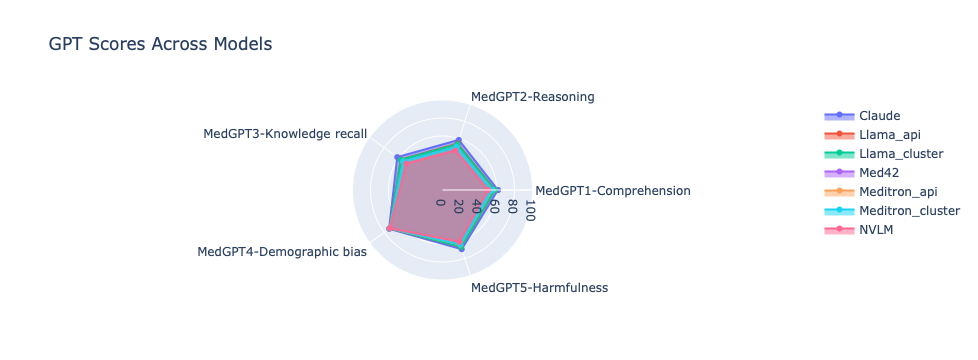

In [6]:
import pandas as pd
import plotly.graph_objects as go

# Load the data (replace with the correct file path)
file_path = '/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv'
df = pd.read_csv(file_path)

# If you want to average over 'subfolder' for each GPT score (assuming multiple rows per subfolder),
# you can group by 'subfolder' and then take the mean of the columns of interest:
average_scores = df.groupby('subfolder')[
    ['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']
].mean()
average_scores.reset_index(inplace=True)

# Extract subfolders (for naming each trace)
subfolders = average_scores['subfolder']

# Extract the scores (radar radii) from the mean columns
scores = average_scores[['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']].values

# Define the categories (theta) to match the columns you used
categories = [
    'MedGPT1-Comprehension', 
    'MedGPT2-Reasoning', 
    'MedGPT3-Knowledge recall', 
    'MedGPT4-Demographic bias', 
    'MedGPT5-Harmfulness'
]

# Alternatively, if you want the labels in your chart to be more concise:
# categories = ['GPT1', 'GPT2', 'GPT3', 'GPT4', 'GPT5']

fig = go.Figure()

# Create one radar trace per subfolder
for i, subfolder in enumerate(subfolders):
    # Close the loop by adding the first score again
    r_values = list(scores[i]) + [scores[i][0]]
    
    # Close the loop in theta by re-adding the first category
    theta_values = categories + [categories[0]]
    
    fig.add_trace(go.Scatterpolar(
        r=r_values,
        theta=theta_values,
        fill='toself',
        name=subfolder
    ))

# Update layout for better aesthetics
fig.update_layout(
    title="GPT Scores Across Models",
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 100]  # Adjust if your scores require a different range
        )
    ),
    showlegend=True
)

# Save to HTML and show the plot
fig.write_html("radar_chart_overall_GPT_Sscores.html", include_plotlyjs="cdn")
#fig.write_image("radar_chart_overall_GPT_Sscores.jpg", format="jpg")
fig.show()

In [23]:
scores

array([[61.59813084, 58.5529595 , 62.14797508, 73.36448598, 69.14953271],
       [58.40902475, 54.2503639 , 57.54439592, 72.59825328, 66.53857351],
       [58.10672515, 53.52192982, 57.16959064, 72.5       , 66.37719298],
       [53.06531532, 49.51951952, 52.58558559, 72.37987988, 62.06456456],
       [55.45705968, 50.286754  , 53.71179039, 72.48180495, 63.86317322],
       [54.89883552, 50.44978166, 53.98689956, 72.46724891, 63.55167394],
       [50.54312865, 46.12207602, 49.80116959, 72.22953216, 60.51900585]])

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/3214074957.py:50: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/3214074957.py:50: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/3214074957.py:50: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/3214074957.py:50: FutureWarning:

Series.__g

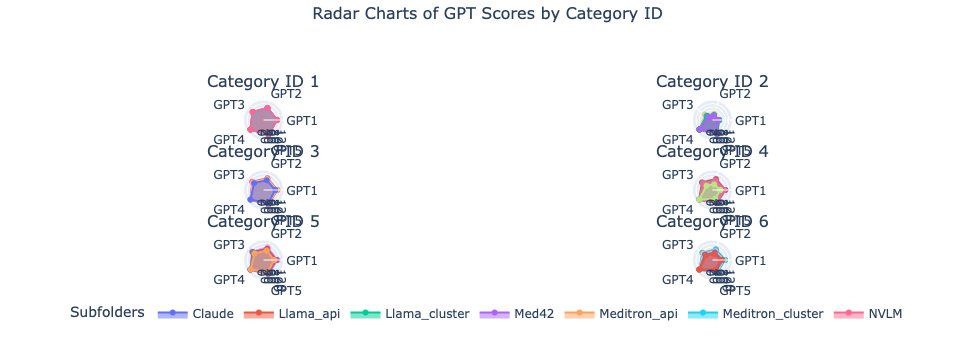

In [21]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the data
file_path = '/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv'
data = pd.read_csv(file_path)

# Sort the data by `category_id` and `subfolder` to ensure proper order
data = data.sort_values(by=['category_id', 'subfolder'])

# Extract unique category_ids (now in sorted order)
category_ids = data['category_id'].unique()

# Extract the categories (GPT scores)
categories = ['GPT1', 'GPT2', 'GPT3', 'GPT4', 'GPT5']

# Define the number of rows and columns for the grid
rows = 3
cols = 2

# Create subplots
fig = make_subplots(
    rows=rows, cols=cols, 
    specs=[[{'type': 'polar'} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[f"Category ID {category_id}" for category_id in category_ids]
)

# Add the first radar chart and let Plotly assign colors automatically
subfolder_color_map = {}
for i, category_id in enumerate(category_ids):
    # Determine the row and column index for the current subplot
    row = i // cols + 1
    col = i % cols + 1

    # Filter the data for the current category_id
    category_data = data[data['category_id'] == category_id]

    # Sort subfolder values for consistent order
    sorted_subfolders = sorted(category_data['subfolder'].unique())

    # Iterate through subfolders in sorted order
    for subfolder in sorted_subfolders:
        subfolder_data = category_data[category_data['subfolder'] == subfolder]
        
        # Ensure unique row per subfolder
        subfolder_scores = subfolder_data[['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']].iloc[0]

        trace = go.Scatterpolar(
            r=list(subfolder_scores) + [subfolder_scores[0]],  # Close the loop
            theta=categories + [categories[0]],  # Close the loop
            fill='toself',
            name=subfolder,
            showlegend=(i == 0)  # Show the legend only for the first subplot
        )
        
        # Add the trace to the subplot
        fig.add_trace(trace, row=row, col=col)
        
        # Capture the assigned color from the first subplot
        if not subfolder_color_map:
            subfolder_color_map[subfolder] = trace.marker.color  # Save color

# Update layout
fig.update_layout(
    height=900,  # Set height to fit all subplots
    title=dict(
        text="Radar Charts of GPT Scores by Category ID",
        x=0.5,  # Center the title horizontally
        y=0.98,  # Move the title up slightly
        xanchor="center",
        yanchor="top",
        font=dict(size=16)  # Adjust title font size if needed
    ),
    showlegend=True,  # Single shared legend
    legend=dict(title="Subfolders", orientation="h", x=0.5, xanchor="center", y=-0.1)
)

# Adjust subplot titles to move them up
for annotation in fig['layout']['annotations']:
    annotation['y'] += 0.05  # Move the title up by 5% of the plot height

# Show the plot
fig.write_html("radar_chart_GPT_Sscores_per_category.html", include_plotlyjs="cdn")
fig.show()

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/1878259073.py:64: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/1878259073.py:64: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/1878259073.py:64: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/1878259073.py:64: FutureWarning:

Series.__g

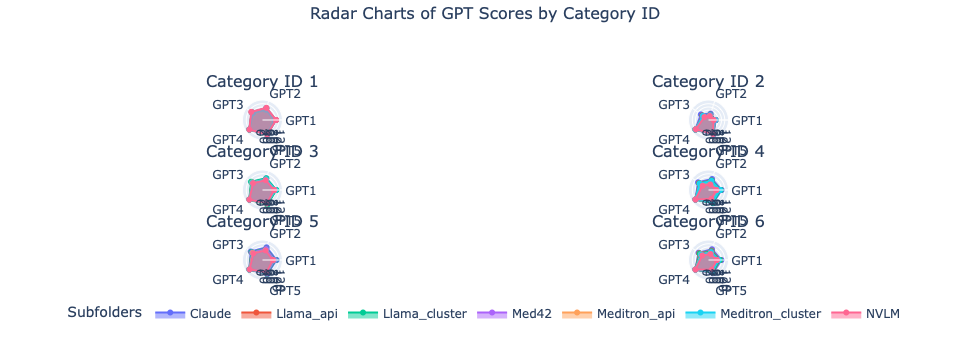

In [4]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the data
file_path = '/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv'
data = pd.read_csv(file_path)

# Sort the data by `category_id` and `subfolder` to ensure proper order
data = data.sort_values(by=['category_id', 'subfolder'])

# Extract unique category_ids (in sorted order) and subfolders
category_ids = data['category_id'].unique()
all_subfolders = sorted(data['subfolder'].unique())

# Create a consistent color mapping for subfolders
# You can choose any palette; here we use Plotly's default qualitative palette.
colors = px.colors.qualitative.Plotly
subfolder_color_map = {
    subfolder: colors[i % len(colors)] 
    for i, subfolder in enumerate(all_subfolders)
}

# Define the categories (GPT scores)
categories = ['GPT1', 'GPT2', 'GPT3', 'GPT4', 'GPT5']

# Define the number of rows and columns for the grid
rows = 3
cols = 2

# Create subplots
fig = make_subplots(
    rows=rows, cols=cols, 
    specs=[[{'type': 'polar'} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[f"Category ID {cid}" for cid in category_ids]
)

# (Optional) - Keep track of which subfolders we've added to the legend
already_in_legend = set()

for i, category_id in enumerate(category_ids):
    # Determine the row and column index for the current subplot
    row = i // cols + 1
    col = i % cols + 1

    # Filter the data for the current category_id
    category_data = data[data['category_id'] == category_id]
    
    # Extract subfolders in sorted order for this category
    sorted_subfolders = sorted(category_data['subfolder'].unique())

    # Create one Scatterpolar trace per subfolder
    for subfolder in sorted_subfolders:
        # Filter out the row for this subfolder
        subfolder_data = category_data[category_data['subfolder'] == subfolder]
        
        # Extract the GPT means
        subfolder_scores = subfolder_data[
            ['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']
        ].iloc[0]
        
        # Convert to list and close the loop
        r_values = list(subfolder_scores) + [subfolder_scores[0]]
        theta_values = categories + [categories[0]]

        # Determine if this subfolder should appear in the legend
        show_legend_entry = (subfolder not in already_in_legend)
        
        # Create the trace
        trace = go.Scatterpolar(
            r=r_values,
            theta=theta_values,
            fill='toself',
            name=subfolder,
            # Use the color map for consistency
            marker=dict(color=subfolder_color_map[subfolder]),
            # Group by subfolder so all subplots share the same legend entry
            legendgroup=subfolder,
            showlegend=show_legend_entry
        )
        
        # Add the trace to the corresponding subplot
        fig.add_trace(trace, row=row, col=col)

        # Mark this subfolder as used in the legend
        if show_legend_entry:
            already_in_legend.add(subfolder)

# Update layout
fig.update_layout(
    height=900,  # Set height to fit all subplots
    title=dict(
        text="Radar Charts of GPT Scores by Category ID",
        x=0.5,  # Center the title horizontally
        y=0.98,  # Move the title up slightly
        xanchor="center",
        yanchor="top",
        font=dict(size=16)  # Adjust title font size if needed
    ),
    showlegend=True,  # Single shared legend
    legend=dict(
        title="Subfolders", 
        orientation="h", 
        x=0.5, xanchor="center", 
        y=-0.1  # Adjust as needed
    )
)

# Adjust subplot titles to move them up a bit
for annotation in fig['layout']['annotations']:
    annotation['y'] += 0.05

# Save and show
fig.write_html("radar_chart_GPT_Sscores_per_category.html", include_plotlyjs="cdn")
fig.show()

In [5]:
subfolder_color_map

{'Claude': '#636EFA',
 'Llama_api': '#EF553B',
 'Llama_local': '#00CC96',
 'Med42': '#AB63FA',
 'Meditron_api': '#FFA15A',
 'Meditron_local': '#19D3F3',
 'NVLM': '#FF6692'}

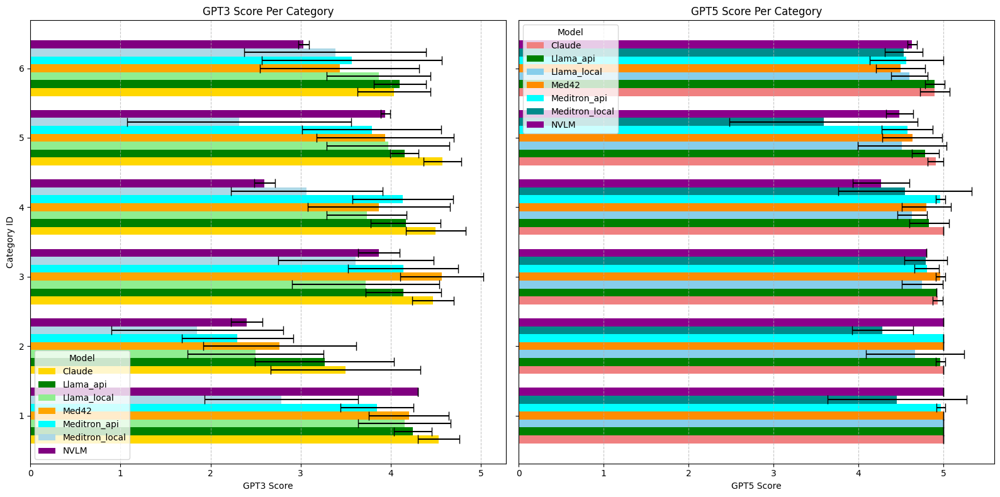

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the CSV file (adjust path as needed)
df = pd.read_csv('/cluster/home/gcardenal/HIV/deploy_medical_LLM_evaluation/deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv')

# Exclude '3_MCQ' category
df = df[df['category_id'] != '3_MCQ']

# Group by 'category_id' and 'model', and calculate the mean and std
# Make sure the column names match those in your CSV
grouped = df.groupby(['category_id', 'subfolder']).agg({
    'GPT3_mean': 'mean',
    'GPT3_std': 'mean',
    'GPT5_mean': 'mean',
    'GPT5_std': 'mean'
}).reset_index()

# Get unique categories and models
categories = grouped['category_id'].unique()
models = grouped['subfolder'].unique()
n_categories = len(categories)
n_models = len(models)

# Calculate bar heights and positions
bar_height = 0.8 / n_models  # Total bar height divided among models
y_positions = np.arange(n_categories)

# Create a figure with two subplots (1 row, 2 columns)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Define specific colors for each model for the Q3 plot
model_colors_q3 = {
    'Llama_local': 'lightgreen',
    'Llama_api': 'green',
    'Claude': 'gold',
    'Med42': 'orange',
    'NVLM': 'purple',
    'Meditron_api': 'cyan',
    'Meditron_local': 'lightblue'
}

# Define specific colors for each model for the Q5 plot
model_colors_q5 = {
    'Llama_local': 'skyblue',
    'Llama_api': 'green',
    'Claude': 'lightcoral',
    'Med42': 'darkorange',
    'NVLM': 'darkmagenta',
    'Meditron_api': 'cyan',
    'Meditron_local': 'darkcyan'
}

# Plot 1: GPT3 Scores per Category
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped[grouped['subfolder'] == model]
    # Ensure the data is aligned with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    # Map category IDs to y positions
    y_offsets = y_positions - 0.4 + i * bar_height + bar_height / 2
    # Get means and standard deviations
    means = model_data['GPT3_mean']
    stds = model_data['GPT3_std']
    # Get the color for the current model
    color = model_colors_q3.get(model, 'gray')  # Default to 'gray' if model not in dict
    # Plot horizontal bars
    ax1.barh(y_offsets, means, height=bar_height, xerr=stds, align='center',
             color=color, label=model, capsize=5)

ax1.set_yticks(y_positions)
ax1.set_yticklabels(categories)
ax1.set_xlabel('GPT3 Score')
ax1.set_ylabel('Category ID')
ax1.set_title('GPT3 Score Per Category')
ax1.legend(title='Model')
ax1.grid(axis='x', linestyle='--', alpha=0.7)

# Plot 2: GPT5 Scores per Category
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped[grouped['subfolder'] == model]
    # Ensure the data is aligned with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    # Map category IDs to y positions
    y_offsets = y_positions - 0.4 + i * bar_height + bar_height / 2
    # Get means and standard deviations
    means = model_data['GPT5_mean']
    stds = model_data['GPT5_std']
    # Get the color for the current model
    color = model_colors_q5.get(model, 'gray')  # Default to 'gray' if model not in dict
    # Plot horizontal bars
    ax2.barh(y_offsets, means, height=bar_height, xerr=stds, align='center',
             color=color, label=model, capsize=5)

ax2.set_yticks(y_positions)
ax2.set_yticklabels([])
ax2.set_xlabel('GPT5 Score')
ax2.set_title('GPT5 Score Per Category')
ax2.legend(title='Model')
ax2.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust the layout to avoid overlap
plt.tight_layout()
plt.show()

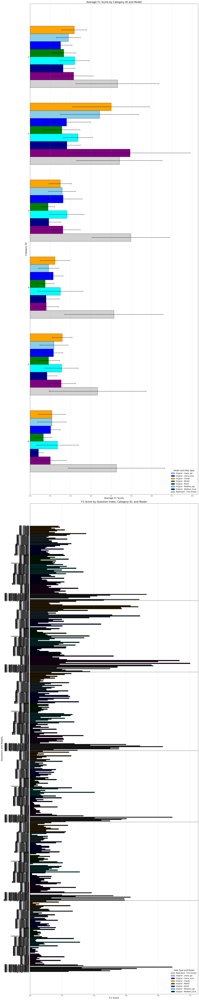

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

df_first = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv')
df_rephrased_first = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_over_iterations.csv')

# Load the data
df_first = df_first[['category_id', 'subfolder', 'synonyms_lemmatized_f1_mean', 'synonyms_lemmatized_f1_std']]
df_first.rename(columns={'subfolder': 'model'}, inplace=True)

df_rephrased_first = df_rephrased_first[['category_id', 'model', 'synonyms_lemmatized_f1_mean', 'synonyms_lemmatized_f1_std']]

# Prepare data for the first subplot
grouped_df = df_first.groupby(['category_id', 'model'])['synonyms_lemmatized_f1_mean'].agg(['mean', 'std']).reset_index()
grouped_df_rephrased = df_rephrased_first.groupby(['category_id', 'model'])['synonyms_lemmatized_f1_mean'].agg(['mean', 'std']).reset_index()

# Merge grouped dataframes on 'category_id' and 'model' using outer join
grouped_merged = pd.merge(
    grouped_df,
    grouped_df_rephrased,
    on=['category_id', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Fill NaN values with zeros
grouped_merged.fillna(0, inplace=True)

# Initialize colors for models
models_colors = {
    'Llama_api': 'skyblue',
    'Llama_local': 'blue',
    'Claude': 'orange',
    'Med42': 'green',
    'NVLM': 'purple',
    'Meditron_api': 'cyan',
    'Meditron_local': 'darkblue'
}

# Get unique categories and models
categories = grouped_merged['category_id'].unique()
models = grouped_merged['model'].unique()
n_models = len(models)
bar_height = 0.8 / n_models
index = np.arange(len(categories))
offset = -0.4 + bar_height / 2

# Set up the figure and axes, increasing the figure size
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 100))
plt.subplots_adjust(hspace=0.5)

# First subplot: Average F1 Score by Category ID and Model
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped_merged[grouped_merged['model'] == model]
    # Ensure data aligns with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    # Positions for the bars
    positions = index + offset + i * bar_height
    # Get values
    mean_original = model_data['mean_original']
    std_original = model_data['std_original']
    mean_rephrased = model_data['mean_rephrased']
    std_rephrased = model_data['std_rephrased']

    # Plot original data
    axes[0].barh(
        y=positions,
        width=mean_original,
        xerr=std_original,
        height=bar_height,
        align='center',
        color=models_colors.get(model, 'gray'),
        edgecolor='black',
        capsize=5
    )
    # Plot rephrased data as a hatch over the original bar
    if not mean_rephrased.isnull().all() and not (mean_rephrased == 0).all():
        axes[0].barh(
            y=positions,
            width=mean_rephrased,
            xerr=std_rephrased,
            height=bar_height,
            align='center',
            facecolor='none',
            edgecolor='black',
            hatch='///',
            capsize=5
        )

# Set y-ticks and labels
axes[0].set_yticks(index)
axes[0].set_yticklabels(categories, fontsize=14)
axes[0].set_xlabel('Average F1 Score', fontsize=16)
axes[0].set_ylabel('Category ID', fontsize=16)
axes[0].set_title('Average F1 Score by Category ID and Model', fontsize=18)
axes[0].invert_yaxis()
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
legend_elements.append(
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased - True Answer')
)
axes[0].legend(handles=legend_elements, title='Model and Data Type', loc='lower right', fontsize=12, title_fontsize=14)

# Prepare data for the second subplot
df_first = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv')
df_rephrased_first = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_over_iterations.csv')
df_first.drop(columns=['model'], inplace=True)
df_first.rename(columns={'subfolder': 'model'}, inplace=True)

df_sorted = df_first.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)
df_rephrased_sorted = df_rephrased_first.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)

# Merge df_sorted and df_rephrased_sorted using outer join
merged_df = pd.merge(
    df_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    df_rephrased_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    on=['category_id', 'question_index', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

merged_df.fillna(0, inplace=True)

y_positions = []
y_labels = []
f1_scores_original = []
f1_scores_rephrased = []
colors_list = []
category_separators = []
category_labels_positions = []
category_labels = []

y_pos = 0
category_gap = 1

for i, category in enumerate(categories):
    category_data = merged_df[merged_df['category_id'] == category]
    models_in_category = category_data['model'].unique()

    # Store position for category label
    category_labels_positions.append(y_pos + (len(category_data) - 1) / 2)
    category_labels.append(f"Category {category}")

    for model in models_in_category:
        model_data = category_data[category_data['model'] == model].reset_index(drop=True)
        num_questions = len(model_data)

        for idx in range(num_questions):
            y_positions.append(y_pos)
            question_index = model_data.iloc[idx]['question_index']
            y_labels.append(f"Q{int(question_index)} - {model}")
            f1_scores_original.append(model_data.iloc[idx]['f1_score_mean_original'])
            f1_scores_rephrased.append(model_data.iloc[idx]['f1_score_mean_rephrased'])
            colors_list.append(models_colors.get(model, 'gray'))
            y_pos += 1

    if i < len(categories) - 1:
        category_separators.append(y_pos - 0.5)
        y_pos += category_gap

# Second subplot: F1 Score by Question Index, Category ID, and Model
axes[1].barh(
    y=y_positions,
    width=f1_scores_original,
    height=0.8,
    color=colors_list,
    edgecolor='black'
)

# Overlay rephrased data as hatches over the original bars
for idx in range(len(y_positions)):
    if f1_scores_rephrased[idx] != 0:
        axes[1].barh(
            y=y_positions[idx],
            width=f1_scores_rephrased[idx],
            height=0.8,
            facecolor='none',
            edgecolor='black',
            hatch='///'
        )

# Set y-axis ticks and labels
axes[1].set_yticks(y_positions)
axes[1].set_yticklabels(y_labels, fontsize=12)

# Add category separators
for sep in category_separators:
    axes[1].axhline(y=sep, color='black', linewidth=1)

# Add category labels on the left side
for pos, label in zip(category_labels_positions, category_labels):
    axes[1].text(
        x=-0.05,
        y=pos,
        s=label,
        va='center',
        ha='right',
        fontsize=14,
        transform=axes[1].get_yaxis_transform()
    )

axes[1].set_xlabel('F1 Score', fontsize=16)
axes[1].set_ylabel('Questions and Models', fontsize=16)
axes[1].set_title('F1 Score by Question Index, Category ID, and Model', fontsize=18)
axes[1].invert_yaxis()
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased - True Answer')
] + [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
axes[1].legend(handles=legend_elements, title='Data Type and Model', loc='lower right', fontsize=12, title_fontsize=14)

# Adjust layout and save
plt.tight_layout()
plt.savefig('f1_scores_large.jpg', dpi=200)  # Increase DPI for better quality
plt.show()

/scratch/tmp.20000286.gcardenal/ipykernel_2479781/1379708491.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



KeyError: 'question_index'

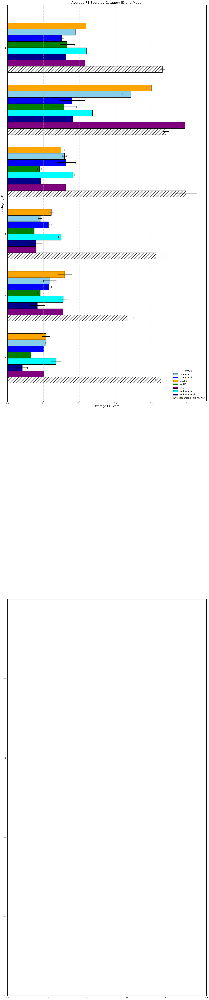

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# -----------------------------------------------------------------
# 1. LOAD THE (ALREADY AVERAGED) DATA
# -----------------------------------------------------------------
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv')
df_rephrased = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')

# -----------------------------------------------------------------
# 2. PREPARE DATA FOR THE FIRST SUBPLOT 
#    (using synonyms_lemmatized_f1_iter_mean and synonyms_lemmatized_f1_iter_std)
# -----------------------------------------------------------------
# We take the columns we need directly, since the CSVs are already averaged


df_first = df[['category_id', 'subfolder', 'synonyms_lemmatized_f1_iter_mean', 'synonyms_lemmatized_f1_iter_std']]
df_first.rename(columns={'subfolder': 'model'}, inplace=True)

df_rephrased_first = df_rephrased[['category_id', 'model', 'synonyms_lemmatized_f1_iter_mean', 'synonyms_lemmatized_f1_iter_std']]

# Merge these two dataframes on ['category_id', 'model'] with outer join
grouped_merged = pd.merge(
    df_first,
    df_rephrased_first,
    on=['category_id', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Fill NaN values with zeros (or you can choose another strategy if needed)
grouped_merged.fillna(0, inplace=True)

# -----------------------------------------------------------------
# 3. SET COLORS AND PREP FOR PLOTTING
# -----------------------------------------------------------------
# Initialize colors for models
models_colors = {
    'Llama_api': 'skyblue',
    'Llama_local': 'blue',
    'Claude': 'orange',
    'Med42': 'green',
    'NVLM': 'purple',
    'Meditron_api': 'cyan',
    'Meditron_local': 'darkblue'
}

# Get unique categories and models
categories = grouped_merged['category_id'].unique()
models = grouped_merged['model'].unique()

n_models = len(models)
bar_height = 0.8 / n_models
index = np.arange(len(categories))
offset = -0.4 + bar_height / 2

# -----------------------------------------------------------------
# 4. SET UP THE FIGURE AND AXES
# -----------------------------------------------------------------
# We'll keep the same overall layout (2 rows, 1 column)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 100))
plt.subplots_adjust(hspace=0.5)

# -----------------------------------------------------------------
# 5. FIRST SUBPLOT: AVERAGE F1 SCORE (FROM PRE-COMPUTED MEANS)
# -----------------------------------------------------------------
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped_merged[grouped_merged['model'] == model]
    # Ensure data aligns with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()

    positions = index + offset + i * bar_height

    # Extract mean & std (original)
    mean_original = model_data['synonyms_lemmatized_f1_iter_mean_original']
    std_original  = model_data['synonyms_lemmatized_f1_iter_std_original']
    # Extract mean & std (rephrased)
    mean_rephrased = model_data['synonyms_lemmatized_f1_iter_mean_rephrased']
    std_rephrased  = model_data['synonyms_lemmatized_f1_iter_std_rephrased']

    # Plot original bars
    axes[0].barh(
        y=positions,
        width=mean_original,
        xerr=std_original,
        height=bar_height,
        align='center',
        color=models_colors.get(model, 'gray'),
        edgecolor='black',
        capsize=5
    )

    # Plot rephrased bars as hatches
    if not mean_rephrased.isnull().all() and not (mean_rephrased == 0).all():
        axes[0].barh(
            y=positions,
            width=mean_rephrased,
            xerr=std_rephrased,
            height=bar_height,
            align='center',
            facecolor='none',
            edgecolor='black',
            hatch='///',
            capsize=5
        )

axes[0].set_yticks(index)
axes[0].set_yticklabels(categories, fontsize=14)
axes[0].set_xlabel('Average F1 Score', fontsize=16)
axes[0].set_ylabel('Category ID', fontsize=16)
axes[0].set_title('Average F1 Score by Category ID and Model', fontsize=18)
axes[0].invert_yaxis()
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend for the first subplot
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'{model_name}') 
    for model_name, color in models_colors.items()
]
legend_elements.append(
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased True Answer')
)
axes[0].legend(handles=legend_elements, title='Model', loc='lower right', 
              fontsize=12, title_fontsize=14)

# -----------------------------------------------------------------
# 6. SECOND SUBPLOT: (ORIGINAL CODE FOR QUESTION-BY-QUESTION F1 SCORES)
#    This part is unchanged from your original code.
# -----------------------------------------------------------------
# Sort dataframes by category_id, question_index, model
df_sorted = df.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)
df_rephrased_sorted = df_rephrased.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)

# Merge df_sorted and df_rephrased_sorted using outer join
merged_df = pd.merge(
    df_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    df_rephrased_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    on=['category_id', 'question_index', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

merged_df.fillna(0, inplace=True)

y_positions = []
y_labels = []
f1_scores_original = []
f1_scores_rephrased = []
colors_list = []
category_separators = []
category_labels_positions = []
category_labels = []

y_pos = 0
category_gap = 1

for i, category in enumerate(categories):
    category_data = merged_df[merged_df['category_id'] == category]
    models_in_category = category_data['model'].unique()

    # Store position for category label
    category_labels_positions.append(y_pos + (len(category_data) - 1) / 2)
    category_labels.append(f"Category {category}")

    for model in models_in_category:
        model_data = category_data[category_data['model'] == model].reset_index(drop=True)
        num_questions = len(model_data)

        for idx in range(num_questions):
            y_positions.append(y_pos)
            question_index = model_data.iloc[idx]['question_index']
            y_labels.append(f"Q{int(question_index)} - {model}")
            f1_scores_original.append(model_data.iloc[idx]['f1_score_mean_original'])
            f1_scores_rephrased.append(model_data.iloc[idx]['f1_score_mean_rephrased'])
            colors_list.append(models_colors.get(model, 'gray'))
            y_pos += 1

    if i < len(categories) - 1:
        category_separators.append(y_pos - 0.5)
        y_pos += category_gap

axes[1].barh(
    y=y_positions,
    width=f1_scores_original,
    height=0.8,
    color=colors_list,
    edgecolor='black'
)

# Overlay rephrased data as hatches
for idx in range(len(y_positions)):
    if f1_scores_rephrased[idx] != 0:
        axes[1].barh(
            y=y_positions[idx],
            width=f1_scores_rephrased[idx],
            height=0.8,
            facecolor='none',
            edgecolor='black',
            hatch='///'
        )

axes[1].set_yticks(y_positions)
axes[1].set_yticklabels(y_labels, fontsize=12)

# Add category separators
for sep in category_separators:
    axes[1].axhline(y=sep, color='black', linewidth=1)

# Add category labels on the left side
for pos, label in zip(category_labels_positions, category_labels):
    axes[1].text(
        x=-0.05,
        y=pos,
        s=label,
        va='center',
        ha='right',
        fontsize=14,
        transform=axes[1].get_yaxis_transform()
    )

axes[1].set_xlabel('F1 Score', fontsize=16)
axes[1].set_ylabel('Questions and Models', fontsize=16)
axes[1].set_title('F1 Score by Question Index, Category ID, and Model', fontsize=18)
axes[1].invert_yaxis()
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased - True Answer')
] + [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
axes[1].legend(handles=legend_elements, title='Data Type and Model', loc='lower right', 
               fontsize=12, title_fontsize=14)

# -----------------------------------------------------------------
# 7. SAVE AND SHOW FIGURE
# -----------------------------------------------------------------
plt.tight_layout()
plt.savefig('f1_scores_large.jpg', dpi=300)
plt.show()

In [27]:
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv')
df_rephrased = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')
df.columns

Index(['nlp_model', 'model', 'subfolder', 'category_id', 'precision_iter_mean',
       'recall_iter_mean', 'f1_score_iter_mean',
       'synonyms_precision_dict_iter_mean', 'synonyms_recall_dict_iter_mean',
       'synonyms_f1_dict_iter_mean', 'synonyms_precision_snomed_iter_mean',
       'synonyms_recall_snomed_iter_mean', 'synonyms_f1_snomed_iter_mean',
       'synonyms_precision_wn_iter_mean', 'synonyms_recall_wn_iter_mean',
       'synonyms_f1_wn_iter_mean',
       'synonyms_lemmatized_precision_dict_iter_mean',
       'synonyms_lemmatized_recall_dict_iter_mean',
       'synonyms_lemmatized_f1_dict_iter_mean',
       'synonyms_lemmatized_precision_snomed_iter_mean',
       'synonyms_lemmatized_recall_snomed_iter_mean',
       'synonyms_lemmatized_f1_snomed_iter_mean',
       'synonyms_lemmatized_precision_wn_iter_mean',
       'synonyms_lemmatized_recall_wn_iter_mean',
       'synonyms_lemmatized_f1_wn_iter_mean', 'precision_iter_std',
       'recall_iter_std', 'f1_score_iter_std',

/scratch/tmp.21356076.gcardenal/ipykernel_1779708/1884417519.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



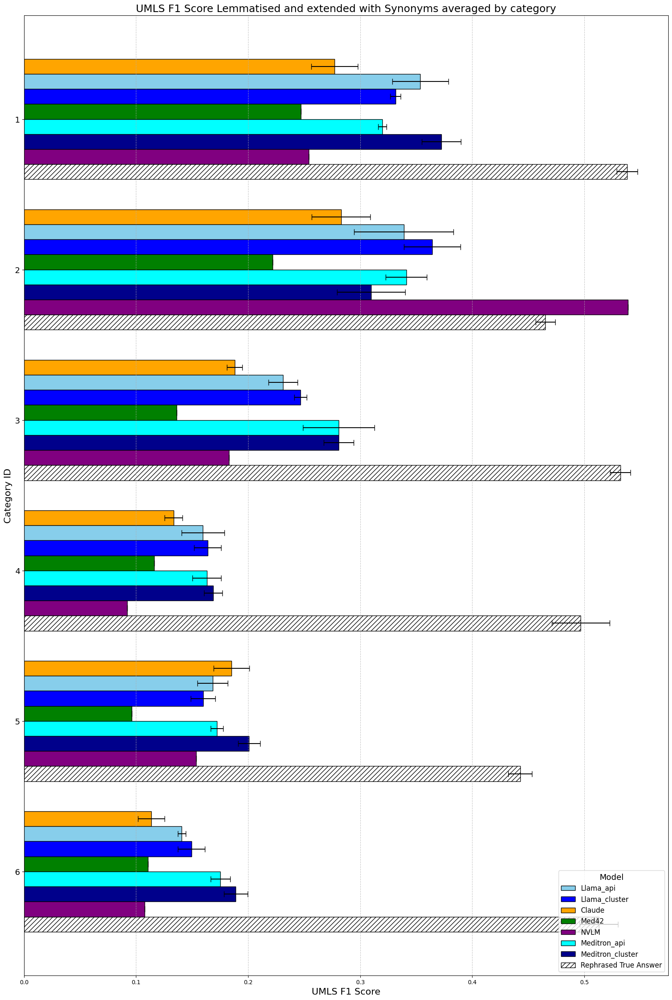

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# -----------------------------------------------------------------
# 1. LOAD THE (ALREADY AVERAGED) DATA
# -----------------------------------------------------------------
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_mean_over_questions.csv')
df_rephrased = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')

# -----------------------------------------------------------------
# 2. PREPARE DATA FOR THE PLOT
#    (using synonyms_lemmatized_f1_iter_mean and synonyms_lemmatized_f1_iter_std)
# -----------------------------------------------------------------
df_first = df[['category_id', 'subfolder', 'synonyms_lemmatized_f1_dict_iter_mean', 'synonyms_lemmatized_f1_dict_iter_std']]
df_first.rename(columns={'subfolder': 'model'}, inplace=True)

df_rephrased_first = df_rephrased[['category_id', 'model', 'synonyms_lemmatized_f1_dict_iter_mean', 'synonyms_lemmatized_f1_dict_iter_std']]

# Merge these two dataframes on ['category_id', 'model'] with outer join
grouped_merged = pd.merge(
    df_first,
    df_rephrased_first,
    on=['category_id', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Fill NaN values with zeros
grouped_merged.fillna(0, inplace=True)

# -----------------------------------------------------------------
# 3. SET COLORS AND PREP FOR PLOTTING
# -----------------------------------------------------------------
models_colors = {
    'Llama_api': 'skyblue',
    'Llama_cluster': 'blue',
    'Claude': 'orange',
    'Med42': 'green',
    'NVLM': 'purple',
    'Meditron_api': 'cyan',
    'Meditron_cluster': 'darkblue'
}

categories = grouped_merged['category_id'].unique()
models = grouped_merged['model'].unique()

n_models = len(models)
bar_height = 0.8 / n_models
index = np.arange(len(categories))
offset = -0.4 + bar_height / 2

# -----------------------------------------------------------------
# 4. CREATE A SINGLE FIGURE AND AXIS
# -----------------------------------------------------------------
# Note the figsize=(20, 100) to maintain a very tall plot.
fig, ax = plt.subplots(figsize=(20, 30))

# -----------------------------------------------------------------
# 5. PLOT: AVERAGE F1 SCORE (FROM PRE-COMPUTED MEANS)
# -----------------------------------------------------------------
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped_merged[grouped_merged['model'] == model]
    # Ensure data aligns with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()

    positions = index + offset + i * bar_height

    # Extract mean & std (original)
    mean_original = model_data['synonyms_lemmatized_f1_dict_iter_mean_original']
    std_original  = model_data['synonyms_lemmatized_f1_dict_iter_std_original']
    # Extract mean & std (rephrased)
    mean_rephrased = model_data['synonyms_lemmatized_f1_dict_iter_mean_rephrased']
    std_rephrased  = model_data['synonyms_lemmatized_f1_dict_iter_std_rephrased']

    # Plot original bars
    ax.barh(
        y=positions,
        width=mean_original,
        xerr=std_original,
        height=bar_height,
        align='center',
        color=models_colors.get(model, 'gray'),
        edgecolor='black',
        capsize=5
    )

    # Plot rephrased bars as hatches (only if non-zero)
    if not mean_rephrased.isnull().all() and not (mean_rephrased == 0).all():
        ax.barh(
            y=positions,
            width=mean_rephrased,
            xerr=std_rephrased,
            height=bar_height,
            align='center',
            facecolor='none',
            edgecolor='black',
            hatch='///',
            capsize=5
        )

# -----------------------------------------------------------------
# 6. FORMAT THE PLOT
# -----------------------------------------------------------------
ax.set_yticks(index)
ax.set_yticklabels(categories, fontsize=14)
ax.set_xlabel('UMLS F1 Score', fontsize=16)
ax.set_ylabel('Category ID', fontsize=16)
ax.set_title('UMLS F1 Score Lemmatised and extended with Synonyms averaged by category', fontsize=18)
ax.invert_yaxis()
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'{model_name}') 
    for model_name, color in models_colors.items()
]
# Add a separate patch for the "rephrased" hatch pattern
legend_elements.append(
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased True Answer')
)
ax.legend(handles=legend_elements, title='Model', loc='lower right', 
          fontsize=12, title_fontsize=14)

plt.savefig('f1_scores_average.jpg', dpi=300)
plt.show()

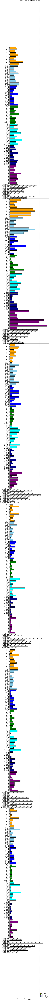

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# -----------------------------------------------------------------
# 1. LOAD & PREPARE THE DATA (for the second plot)
# -----------------------------------------------------------------
df_first = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged_over_iterations.csv')
df_rephrased_first = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_over_iterations.csv')

# Rename columns so 'model' is consistent
df_first.drop(columns=['model'], inplace=True)  # Remove any old 'model' column if present
df_first.rename(columns={'subfolder': 'model'}, inplace=True)

# Sort each dataframe by category_id, question_index, model
df_sorted = df_first.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)
df_rephrased_sorted = df_rephrased_first.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)

# Merge df_sorted and df_rephrased_sorted using an outer join
merged_df = pd.merge(
    df_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    df_rephrased_sorted[['category_id', 'question_index', 'model', 'f1_score_mean']],
    on=['category_id', 'question_index', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Replace NaNs with 0
merged_df.fillna(0, inplace=True)

# -----------------------------------------------------------------
# 2. DEFINE COLORS, GET UNIQUE CATEGORIES, AND BUILD LISTS FOR PLOTTING
# -----------------------------------------------------------------
models_colors = {
    'Llama_api': 'skyblue',
    'Llama_local': 'blue',
    'Claude': 'orange',
    'Med42': 'green',
    'NVLM': 'purple',
    'Meditron_api': 'cyan',
    'Meditron_local': 'darkblue'
}

categories = merged_df['category_id'].unique()

y_positions = []
y_labels = []
f1_scores_original = []
f1_scores_rephrased = []
colors_list = []
category_separators = []
category_labels_positions = []
category_labels = []

y_pos = 0
category_gap = 1  # Space between categories for visual clarity

# Build lists that will be used to create the barh chart
for i, category in enumerate(categories):
    category_data = merged_df[merged_df['category_id'] == category]
    models_in_category = category_data['model'].unique()
    
    # Position for category label (in the middle of the block)
    category_labels_positions.append(y_pos + (len(category_data) - 1) / 2)
    category_labels.append(f"Category {category}")

    for model in models_in_category:
        model_data = category_data[category_data['model'] == model].reset_index(drop=True)
        num_questions = len(model_data)

        for idx in range(num_questions):
            y_positions.append(y_pos)
            question_index = model_data.iloc[idx]['question_index']
            # Create a label like "Q3 - Llama_api"
            y_labels.append(f"Q{int(question_index)} - {model}")

            # Original and rephrased F1 scores
            f1_original = model_data.iloc[idx]['f1_score_mean_original']
            f1_rephrased = model_data.iloc[idx]['f1_score_mean_rephrased']

            f1_scores_original.append(f1_original)
            f1_scores_rephrased.append(f1_rephrased)
            # Use the predefined color for the model, default to gray if missing
            colors_list.append(models_colors.get(model, 'gray'))

            y_pos += 1

    # Add a horizontal separator line after this category (except the last one)
    if i < len(categories) - 1:
        category_separators.append(y_pos - 0.5)
        y_pos += category_gap  # Extra space before next category starts

# -----------------------------------------------------------------
# 3. MAKE A SINGLE LARGE PLOT (THE "SECOND SUBPLOT" STANDALONE)
# -----------------------------------------------------------------
fig, ax = plt.subplots(figsize=(15, 300))  # Very tall figure for thick bars

# Plot original F1 scores as filled bars
ax.barh(
    y=y_positions,
    width=f1_scores_original,
    height=0.8,
    color=colors_list,
    edgecolor='black'
)

# Overlay rephrased F1 scores with hatch
for idx, y in enumerate(y_positions):
    rephrased_width = f1_scores_rephrased[idx]
    if rephrased_width != 0:
        ax.barh(
            y=y,
            width=rephrased_width,
            height=0.8,
            facecolor='none',  # Transparent fill
            edgecolor='black',
            hatch='///'
        )

# -----------------------------------------------------------------
# 4. FORMATTING & ANNOTATIONS
# -----------------------------------------------------------------
# Set the y-axis ticks & labels
ax.set_yticks(y_positions)
ax.set_yticklabels(y_labels, fontsize=12)

# Draw category separators
for sep in category_separators:
    ax.axhline(y=sep, color='black', linewidth=1)

# Add category labels on the left side
for pos, label in zip(category_labels_positions, category_labels):
    ax.text(
        x=-0.05,
        y=pos,
        s=label,
        va='center',
        ha='right',
        fontsize=14,
        transform=ax.get_yaxis_transform()
    )

ax.set_xlabel('F1 Score', fontsize=16)
ax.set_ylabel('Questions and Models', fontsize=16)
ax.set_title('F1 Score by Question Index, Category ID, and Model', fontsize=18)
ax.invert_yaxis()
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor='white', edgecolor='black', hatch='///', label='Rephrased - True Answer')
] + [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') 
    for model, color in models_colors.items()
]
ax.legend(
    handles=legend_elements,
    title='Data Type and Model',
    loc='lower right',
    fontsize=12,
    title_fontsize=14
)

# -----------------------------------------------------------------
# 5. SAVE/SHOW THE PLOT
# -----------------------------------------------------------------
plt.tight_layout()
plt.savefig('f1_scores_second_subplot.jpg', dpi=200)  # Adjust filename/DPI as needed
plt.show()

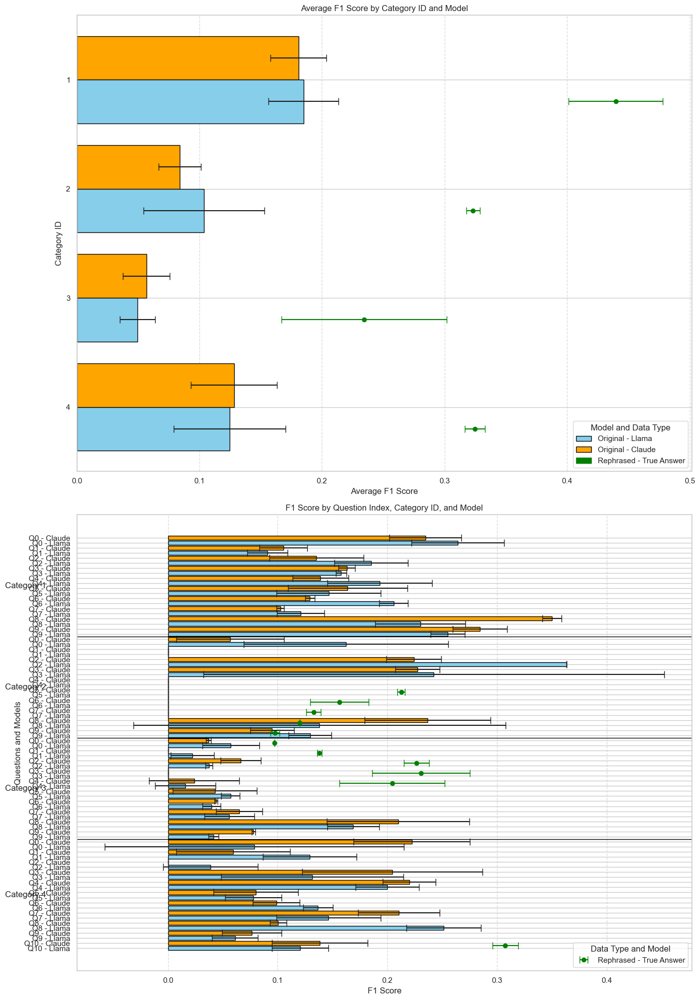

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from collections import OrderedDict

# Load the data
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')
df_rephrased = pd.read_csv('/Users/gonuni/Desktop/College/CBB/HIV_LLMs/Medical_LLM_Evaluation/evaluation_results/evaluation_results_rephrased_check_merged-Copy1.csv')

# Exclude rows where 'category_id' is '3_MCQ'
df = df[df['category_id'] != '3_MCQ']
df_rephrased = df_rephrased[df_rephrased['category_id'] != '3_MCQ']

# Prepare data for the first subplot
grouped_df = df.groupby(['category_id', 'model']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean'
}).reset_index()
grouped_df_rephrased = df_rephrased.groupby(['category_id', 'model']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean'
}).reset_index()

# Merge grouped dataframes on 'category_id' and 'model' using outer join
grouped_merged = pd.merge(
    grouped_df,
    grouped_df_rephrased,
    on=['category_id', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Fill NaN values with zeros
grouped_merged.fillna(0, inplace=True)

# Initialize colors for models
models_colors = {
    'Llama': 'skyblue',
    'Claude': 'orange',
    # Add other models and colors as needed
}

# Get unique categories and models
categories = grouped_merged['category_id'].unique()
models = grouped_merged['model'].unique()
n_models = len(models)
bar_height = 0.8 / n_models
index = np.arange(len(categories))
offset = -0.4 + bar_height / 2

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 20))
plt.subplots_adjust(hspace=0.5)

### First Subplot: Average F1 Score by Category ID and Model ###
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped_merged[grouped_merged['model'] == model]
    # Ensure data aligns with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    # Positions for the bars
    positions = index + offset + i * bar_height
    # Get values
    mean_original = model_data['f1_score_mean_original']
    std_original = model_data['f1_score_std_original']
    mean_rephrased = model_data['f1_score_mean_rephrased']
    std_rephrased = model_data['f1_score_std_rephrased']

    # Plot original data with error bars
    axes[0].barh(
        y=positions,
        width=mean_original,
        xerr=std_original,
        height=bar_height,
        align='center',
        color=models_colors.get(model, 'gray'),
        edgecolor='black',
        capsize=5
    )

    # Plot rephrased data as green lines with error bars
    for idx, pos in enumerate(positions):
        if mean_rephrased[idx] != 0:
            axes[0].errorbar(
                x=mean_rephrased[idx],
                y=pos,
                xerr=std_rephrased[idx],
                fmt='o',
                color='green',
                ecolor='green',
                capsize=5,
                label='Rephrased - True Answer' if i == 0 and idx == 0 else ""
            )

# Set y-ticks and labels
axes[0].set_yticks(index)
axes[0].set_yticklabels(categories)
axes[0].set_xlabel('Average F1 Score')
axes[0].set_ylabel('Category ID')
axes[0].set_title('Average F1 Score by Category ID and Model')
axes[0].invert_yaxis()
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Create custom legend
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
legend_elements.append(
    Patch(facecolor='green', edgecolor='green', label='Rephrased - True Answer')
)
axes[0].legend(handles=legend_elements, title='Model and Data Type', loc='lower right')

### Second Subplot: F1 Score by Question Index, Category ID, and Model ###
# Prepare data for the second subplot
df_sorted = df.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)
df_rephrased_sorted = df_rephrased.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)

# Merge df_sorted and df_rephrased_sorted using outer join
merged_df = pd.merge(
    df_sorted[['category_id', 'question_index', 'model', 'f1_score_mean', 'f1_score_std']],
    df_rephrased_sorted[['category_id', 'question_index', 'model', 'f1_score_mean', 'f1_score_std']],
    on=['category_id', 'question_index', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

merged_df.fillna(0, inplace=True)

# Sort merged_df
merged_df.sort_values(by=['category_id', 'question_index', 'model'], inplace=True)
merged_df.reset_index(drop=True, inplace=True)

# Create y_positions
merged_df['y_position'] = merged_df.index

# Create y_labels
merged_df['y_label'] = merged_df.apply(
    lambda row: f"Q{int(row['question_index'])} - {row['model']}", axis=1
)

# Get colors for models
merged_df['color'] = merged_df['model'].apply(lambda model: models_colors.get(model, 'gray'))

# Collect data
y_positions = merged_df['y_position']
y_labels = merged_df['y_label']
f1_scores_original = merged_df['f1_score_mean_original']
std_original = merged_df['f1_score_std_original']
f1_scores_rephrased = merged_df['f1_score_mean_rephrased']
std_rephrased = merged_df['f1_score_std_rephrased']
colors_list = merged_df['color']

# Plot model F1 scores with error bars
axes[1].barh(
    y=y_positions,
    width=f1_scores_original,
    xerr=std_original,
    height=0.8,
    color=colors_list,
    edgecolor='black',
    capsize=5,
    align='center'
)

# Plot rephrased data as green lines with error bars
question_indices = merged_df['question_index'].unique()
for question_index in question_indices:
    question_data = merged_df[merged_df['question_index'] == question_index]
    y_positions_question = question_data['y_position'].values
    if len(y_positions_question) > 0:
        # Compute middle y_position
        y_middle = y_positions_question.mean()
        # Get rephrased F1 score and std
        f1_rephrased = question_data['f1_score_mean_rephrased'].mean()
        std_rephrased = question_data['f1_score_std_rephrased'].mean()
        # Only plot if rephrased data is available
        if f1_rephrased != 0:
            axes[1].errorbar(
                x=f1_rephrased,
                y=y_middle,
                xerr=std_rephrased,
                fmt='o',
                color='green',
                ecolor='green',
                capsize=5,
                label='Rephrased - True Answer' if question_index == question_indices[0] else ""
            )

# Remove duplicate labels in legend
handles, labels = axes[1].get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
axes[1].legend(by_label.values(), by_label.keys(), title='Data Type and Model', loc='lower right')

# Set y-axis ticks and labels
axes[1].set_yticks(y_positions)
axes[1].set_yticklabels(y_labels)

# Add category separators
category_changes = merged_df['category_id'].ne(merged_df['category_id'].shift())
separator_positions = merged_df[category_changes].index.values - 0.5
for sep in separator_positions[1:]:
    axes[1].axhline(y=sep, color='black', linewidth=1)

# Add category labels
category_positions = merged_df.groupby('category_id')['y_position'].mean()
for category_id, y_pos in category_positions.items():
    axes[1].text(
        x=-0.05,
        y=y_pos,
        s=f"Category {category_id}",
        va='center',
        ha='right',
        fontsize=12,
        transform=axes[1].get_yaxis_transform()
    )

axes[1].set_xlabel('F1 Score')
axes[1].set_ylabel('Questions and Models')
axes[1].set_title('F1 Score by Question Index, Category ID, and Model')
axes[1].invert_yaxis()
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout and show plot
plt.tight_layout()
plt.savefig('f1_scores.jpg')
plt.show()

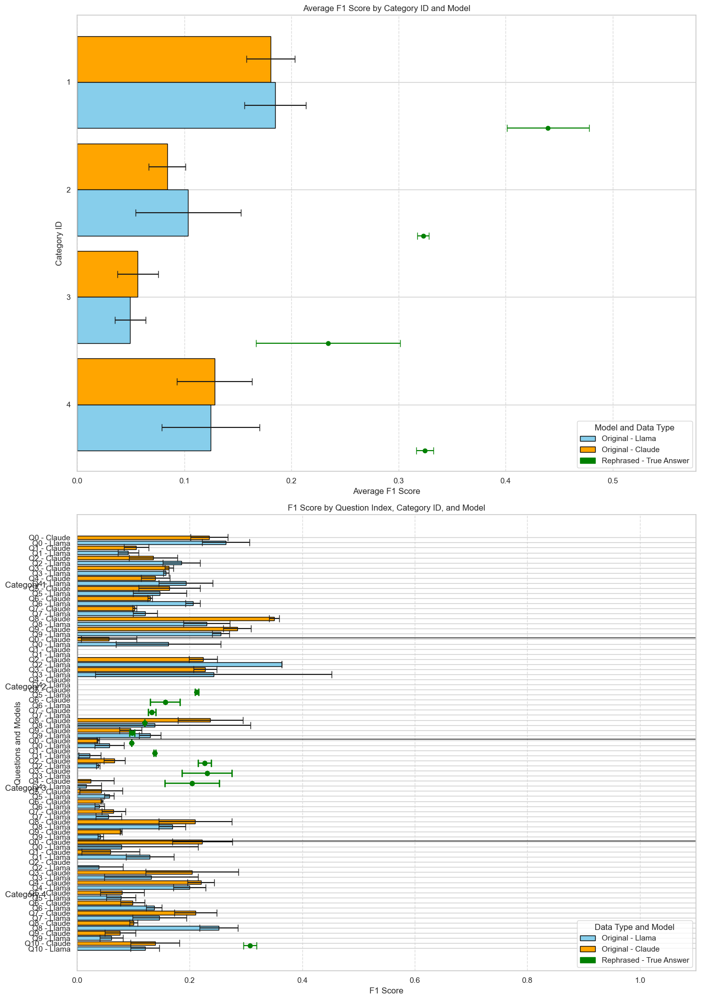

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from collections import OrderedDict

# Load the data
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')
df_rephrased = pd.read_csv('/Users/gonuni/Desktop/College/CBB/HIV_LLMs/Medical_LLM_Evaluation/evaluation_results/evaluation_results_rephrased_check_merged-Copy1.csv')

# Exclude rows where 'category_id' is '3_MCQ'
df = df[df['category_id'] != '3_MCQ']
df_rephrased = df_rephrased[df_rephrased['category_id'] != '3_MCQ']

# Prepare data for the first subplot
grouped_df = df.groupby(['category_id', 'model']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean'
}).reset_index()
grouped_df_rephrased = df_rephrased.groupby(['category_id', 'model']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean'
}).reset_index()

# Merge grouped dataframes on 'category_id' and 'model' using outer join
grouped_merged = pd.merge(
    grouped_df,
    grouped_df_rephrased,
    on=['category_id', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

# Fill NaN values with zeros
grouped_merged.fillna(0, inplace=True)

# Initialize colors for models
models_colors = {
    'Llama': 'skyblue',
    'Claude': 'orange',
    # Add other models and colors as needed
}

# Get unique categories and models
categories = grouped_merged['category_id'].unique()
models = grouped_merged['model'].unique()
n_models = len(models)
bar_height = 0.6  # Increased bar height for thicker bars
index = np.arange(len(categories))
bar_spacing = 0.2  # Added spacing between groups

# Adjust index to include spacing
index = index * (bar_height * n_models + bar_spacing)

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 20))
plt.subplots_adjust(hspace=0.5)

### First Subplot: Average F1 Score by Category ID and Model ###
for i, model in enumerate(models):
    # Filter data for the current model
    model_data = grouped_merged[grouped_merged['model'] == model]
    # Ensure data aligns with categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    # Positions for the bars
    positions = index + i * bar_height
    # Get values
    mean_original = model_data['f1_score_mean_original']
    std_original = model_data['f1_score_std_original']
    mean_rephrased = model_data['f1_score_mean_rephrased']
    std_rephrased = model_data['f1_score_std_rephrased']

    # Plot original data with error bars
    axes[0].barh(
        y=positions,
        width=mean_original,
        xerr=std_original,
        height=bar_height,
        align='center',
        color=models_colors.get(model, 'gray'),
        edgecolor='black',
        capsize=5,
        label=f'Original - {model}' if i == 0 else ""
    )

    # Plot rephrased data as green lines with error bars
    for idx, pos in enumerate(positions):
        if mean_rephrased[idx] != 0:
            axes[0].errorbar(
                x=mean_rephrased[idx],
                y=pos + bar_height / 2,  # Position between bars
                xerr=std_rephrased[idx],
                fmt='o',
                color='green',
                ecolor='green',
                capsize=5,
                label='Rephrased - True Answer' if i == 0 and idx == 0 else ""
            )

# Set y-ticks and labels
axes[0].set_yticks(index + bar_height * (n_models - 1) / 2)
axes[0].set_yticklabels(categories)
axes[0].set_xlabel('Average F1 Score')
axes[0].set_ylabel('Category ID')
axes[0].set_title('Average F1 Score by Category ID and Model')
axes[0].invert_yaxis()
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Adjust x-axis limit to include highest rephrased F1 score plus its standard deviation
max_rephrased = grouped_merged['f1_score_mean_rephrased'].max()
std_rephrased_max = grouped_merged.loc[grouped_merged['f1_score_mean_rephrased'] == max_rephrased, 'f1_score_std_rephrased'].values[0]
axes[0].set_xlim([0, max_rephrased + std_rephrased_max + 0.1])  # Add extra margin if needed

# Create custom legend
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
legend_elements.append(
    Patch(facecolor='green', edgecolor='green', label='Rephrased - True Answer')
)
axes[0].legend(handles=legend_elements, title='Model and Data Type', loc='lower right')

### Second Subplot: F1 Score by Question Index, Category ID, and Model ###
# Prepare data for the second subplot
df_sorted = df.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)
df_rephrased_sorted = df_rephrased.sort_values(by=['category_id', 'question_index', 'model']).reset_index(drop=True)

# Merge df_sorted and df_rephrased_sorted using outer join
merged_df = pd.merge(
    df_sorted[['category_id', 'question_index', 'model', 'f1_score_mean', 'f1_score_std']],
    df_rephrased_sorted[['category_id', 'question_index', 'model', 'f1_score_mean', 'f1_score_std']],
    on=['category_id', 'question_index', 'model'],
    suffixes=('_original', '_rephrased'),
    how='outer'
)

merged_df.fillna(0, inplace=True)

# Sort merged_df
merged_df.sort_values(by=['category_id', 'question_index', 'model'], inplace=True)
merged_df.reset_index(drop=True, inplace=True)

# Create y_positions with increased separation
bar_height_2 = 0.6  # Increased bar height
bar_spacing_2 = 0.2  # Spacing between groups
merged_df['y_position'] = np.arange(len(merged_df)) * (bar_height_2 + bar_spacing_2)

# Create y_labels
merged_df['y_label'] = merged_df.apply(
    lambda row: f"Q{int(row['question_index'])} - {row['model']}", axis=1
)

# Get colors for models
merged_df['color'] = merged_df['model'].apply(lambda model: models_colors.get(model, 'gray'))

# Collect data
y_positions = merged_df['y_position']
y_labels = merged_df['y_label']
f1_scores_original = merged_df['f1_score_mean_original']
std_original = merged_df['f1_score_std_original']
f1_scores_rephrased = merged_df['f1_score_mean_rephrased']
std_rephrased = merged_df['f1_score_std_rephrased']
colors_list = merged_df['color']

# Plot model F1 scores with error bars
axes[1].barh(
    y=y_positions,
    width=f1_scores_original,
    xerr=std_original,
    height=bar_height_2,
    color=colors_list,
    edgecolor='black',
    capsize=5,
    align='center',
    label='_nolegend_'  # Exclude from legend
)

# Plot rephrased data as green lines with error bars
questions = merged_df[['question_index', 'y_position']].drop_duplicates()
for idx, row in questions.iterrows():
    question_index = row['question_index']
    y_positions_question = merged_df[merged_df['question_index'] == question_index]['y_position'].values
    y_middle = y_positions_question.mean()
    f1_rephrased = merged_df[merged_df['question_index'] == question_index]['f1_score_mean_rephrased'].mean()
    std_rephrased_value = merged_df[merged_df['question_index'] == question_index]['f1_score_std_rephrased'].mean()
    # Only plot if rephrased data is available
    if f1_rephrased != 0:
        axes[1].errorbar(
            x=f1_rephrased,
            y=y_middle,
            xerr=std_rephrased_value,
            fmt='o',
            color='green',
            ecolor='green',
            capsize=5,
            label='Rephrased - True Answer' if idx == 0 else ""
        )

# Remove duplicate labels in legend
legend_elements = [
    Patch(facecolor=color, edgecolor='black', label=f'Original - {model}') for model, color in models_colors.items()
]
legend_elements.append(
    Patch(facecolor='green', edgecolor='green', label='Rephrased - True Answer')
)
axes[1].legend(handles=legend_elements, title='Data Type and Model', loc='lower right')

# Set y-axis ticks and labels
axes[1].set_yticks(y_positions)
axes[1].set_yticklabels(y_labels)

# Adjust x-axis limit to include highest rephrased F1 score plus its standard deviation
max_rephrased_2 = merged_df['f1_score_mean_rephrased'].max()
std_rephrased_max_2 = merged_df.loc[merged_df['f1_score_mean_rephrased'] == max_rephrased_2, 'f1_score_std_rephrased'].values[0]
axes[1].set_xlim([0, max_rephrased_2 + std_rephrased_max_2 + 0.1])  # Add extra margin if needed


# Add category separators
category_changes = merged_df['category_id'].ne(merged_df['category_id'].shift())
separator_indices = merged_df[category_changes].index.values
separator_positions = merged_df.loc[separator_indices, 'y_position'].values - bar_spacing_2 / 2

for sep in separator_positions[1:]:
    axes[1].axhline(y=sep - bar_spacing_2 / 2, color='black', linewidth=1)

# Add category labels
category_positions = merged_df.groupby('category_id')['y_position'].mean()
for category_id, y_pos in category_positions.items():
    axes[1].text(
        x=-0.05,
        y=y_pos,
        s=f"Category {category_id}",
        va='center',
        ha='right',
        fontsize=12,
        transform=axes[1].get_yaxis_transform()
    )

axes[1].set_xlabel('F1 Score')
axes[1].set_ylabel('Questions and Models')
axes[1].set_title('F1 Score by Question Index, Category ID, and Model')
axes[1].invert_yaxis()
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout and show plot
plt.tight_layout()
plt.savefig('f1_scores.jpg')
plt.show()

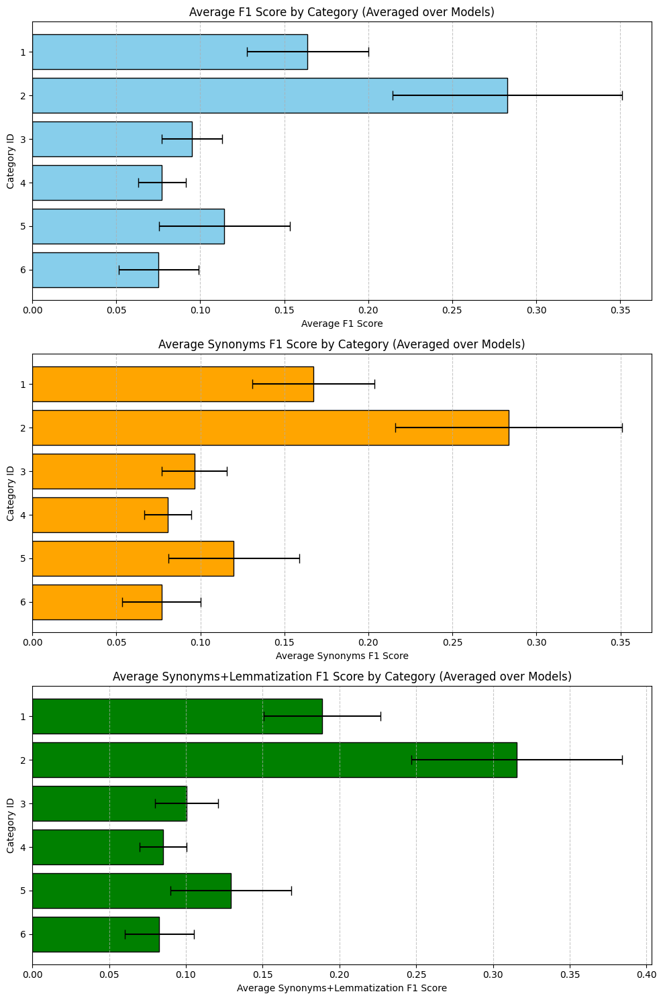

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the merged CSV
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')

# Exclude '3_MCQ'
df = df[df['category_id'] != '3_MCQ']

# Group by 'category_id' and compute mean of means and mean of std over models and questions
# Actually, since 'f1_score_mean' etc. are already aggregated metrics,
# we should just aggregate them again by category.
# If they represent per-question averages, grouping by category_id will average over questions/models.
grouped = df.groupby('category_id').agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean',
    'synonyms_f1_mean': 'mean',
    'synonyms_f1_std': 'mean',
    'synonyms_lemmatized_f1_mean': 'mean',
    'synonyms_lemmatized_f1_std': 'mean'
}).reset_index()

# Extract categories and sort them if needed
categories = grouped['category_id'].unique()
index = np.arange(len(categories))

# Set up the figure and subplots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))
plt.subplots_adjust(hspace=0.4)

# Subplot 1: f1_score
means = grouped['f1_score_mean']
stds = grouped['f1_score_std']
axes[0].barh(y=index, width=means, xerr=stds, align='center', color='skyblue', edgecolor='black', capsize=5)
axes[0].set_yticks(index)
axes[0].set_yticklabels(categories)
axes[0].invert_yaxis()
axes[0].set_xlabel('Average F1 Score')
axes[0].set_ylabel('Category ID')
axes[0].set_title('Average F1 Score by Category (Averaged over Models)')
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Subplot 2: synonyms_f1
means_syn = grouped['synonyms_f1_mean']
stds_syn = grouped['synonyms_f1_std']
axes[1].barh(y=index, width=means_syn, xerr=stds_syn, align='center', color='orange', edgecolor='black', capsize=5)
axes[1].set_yticks(index)
axes[1].set_yticklabels(categories)
axes[1].invert_yaxis()
axes[1].set_xlabel('Average Synonyms F1 Score')
axes[1].set_ylabel('Category ID')
axes[1].set_title('Average Synonyms F1 Score by Category (Averaged over Models)')
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Subplot 3: synonyms_lemmatized_f1
means_lemma = grouped['synonyms_lemmatized_f1_mean']
stds_lemma = grouped['synonyms_lemmatized_f1_std']
axes[2].barh(y=index, width=means_lemma, xerr=stds_lemma, align='center', color='green', edgecolor='black', capsize=5)
axes[2].set_yticks(index)
axes[2].set_yticklabels(categories)
axes[2].invert_yaxis()
axes[2].set_xlabel('Average Synonyms+Lemmatization F1 Score')
axes[2].set_ylabel('Category ID')
axes[2].set_title('Average Synonyms+Lemmatization F1 Score by Category (Averaged over Models)')
axes[2].grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

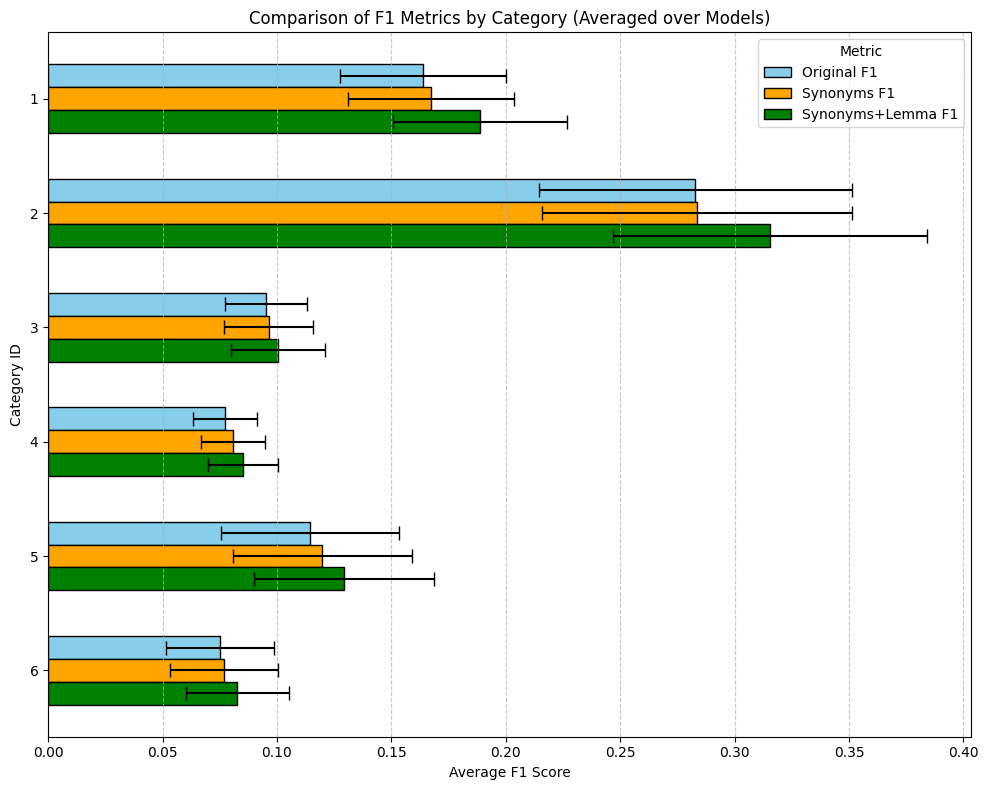

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the merged CSV
df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')

# Exclude '3_MCQ' if needed
df = df[df['category_id'] != '3_MCQ']

# Aggregate by category_id only
grouped = df.groupby('category_id').agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean',
    'synonyms_f1_mean': 'mean',
    'synonyms_f1_std': 'mean',
    'synonyms_lemmatized_f1_mean': 'mean',
    'synonyms_lemmatized_f1_std': 'mean'
}).reset_index()

categories = grouped['category_id'].unique()
index = np.arange(len(categories))

# Define metrics and their labels/colors
metrics = [
    ('f1_score_mean', 'f1_score_std', 'Original F1', 'skyblue'),
    ('synonyms_f1_mean', 'synonyms_f1_std', 'Synonyms F1', 'orange'),
    ('synonyms_lemmatized_f1_mean', 'synonyms_lemmatized_f1_std', 'Synonyms+Lemma F1', 'green')
]

bar_height = 0.2  # Adjust as needed
fig, ax = plt.subplots(figsize=(10, 8))

# We have 3 metrics, so we create offsets to place bars side-by-side
num_metrics = len(metrics)
# For i-th metric, position = index + offset
# We'll center the cluster around the category: offsets will range from negative to positive
for i, (mean_col, std_col, label, color) in enumerate(metrics):
    offset = (i - (num_metrics - 1) / 2) * bar_height
    means = grouped[mean_col]
    stds = grouped[std_col]

    ax.barh(
        y=index + offset,
        width=means,
        xerr=stds,
        height=bar_height,
        align='center',
        color=color,
        edgecolor='black',
        capsize=5,
        label=label
    )

ax.set_yticks(index)
ax.set_yticklabels(categories)
ax.invert_yaxis()  # So that the first category is at the top
ax.set_xlabel('Average F1 Score')
ax.set_ylabel('Category ID')
ax.set_title('Comparison of F1 Metrics by Category (Averaged over Models)')
ax.grid(axis='x', linestyle='--', alpha=0.7)
ax.legend(title='Metric')

plt.tight_layout()
plt.show()

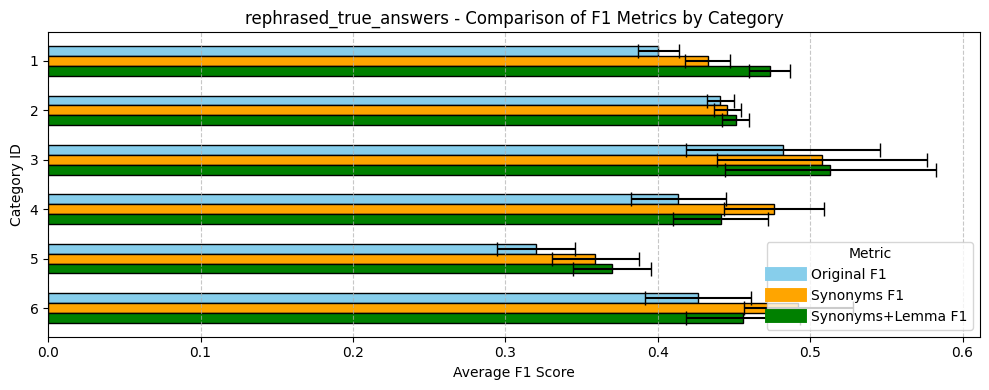

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the merged CSV
#df = pd.read_csv('../deploy_medical_llm_evaluation/evaluation_results/evaluation_results_merged.csv')
df = pd.read_csv('.././deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_over_iterations.csv')

# Exclude '3_MCQ' if needed
df = df[df['category_id'] != '3_MCQ']

# Group by model and category_id
grouped = df.groupby(['model', 'category_id']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean',
    'synonyms_f1_mean': 'mean',
    'synonyms_f1_std': 'mean',
    'synonyms_lemmatized_f1_mean': 'mean',
    'synonyms_lemmatized_f1_std': 'mean'
}).reset_index()

# Extract unique models and categories
models = grouped['model'].unique()
categories = grouped['category_id'].unique()
index = np.arange(len(categories))

# Define metrics
metrics = [
    ('f1_score_mean', 'f1_score_std', 'Original F1', 'skyblue'),
    ('synonyms_f1_mean', 'synonyms_f1_std', 'Synonyms F1', 'orange'),
    ('synonyms_lemmatized_f1_mean', 'synonyms_lemmatized_f1_std', 'Synonyms+Lemma F1', 'green')
]

bar_height = 0.2
num_metrics = len(metrics)
fig_height = len(models) * 4  # Adjust as needed

fig, axes = plt.subplots(nrows=len(models), ncols=1, figsize=(10, fig_height))
if len(models) == 1:
    # If there's only one model, axes might not be a list. Make it a list for uniformity
    axes = [axes]

for ax, model in zip(axes, models):
    # Filter data for the current model
    model_data = grouped[grouped['model'] == model]
    # Ensure order of categories
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    
    # Plot each metric as a cluster of bars
    for i, (mean_col, std_col, label, color) in enumerate(metrics):
        offset = (i - (num_metrics - 1) / 2) * bar_height
        means = model_data[mean_col]
        stds = model_data[std_col]

        ax.barh(
            y=index + offset,
            width=means,
            xerr=stds,
            height=bar_height,
            align='center',
            color=color,
            edgecolor='black',
            capsize=5,
            label=label if i == 0 else None  # Label only once per subplot for clarity
        )

    ax.set_yticks(index)
    ax.set_yticklabels(categories)
    ax.invert_yaxis()  # So that the first category is at the top
    ax.set_xlabel('Average F1 Score')
    ax.set_ylabel('Category ID')
    ax.set_title(f'{model} - Comparison of F1 Metrics by Category')
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    # Create a small legend for this subplot
    # Only need legend for metrics (once is enough if desired)
    legend_elements = [
        plt.Line2D([0],[0], color='skyblue', lw=10, label='Original F1'),
        plt.Line2D([0],[0], color='orange', lw=10, label='Synonyms F1'),
        plt.Line2D([0],[0], color='green', lw=10, label='Synonyms+Lemma F1')
    ]
    ax.legend(handles=legend_elements, loc='lower right', title='Metric')

plt.tight_layout()
plt.show()

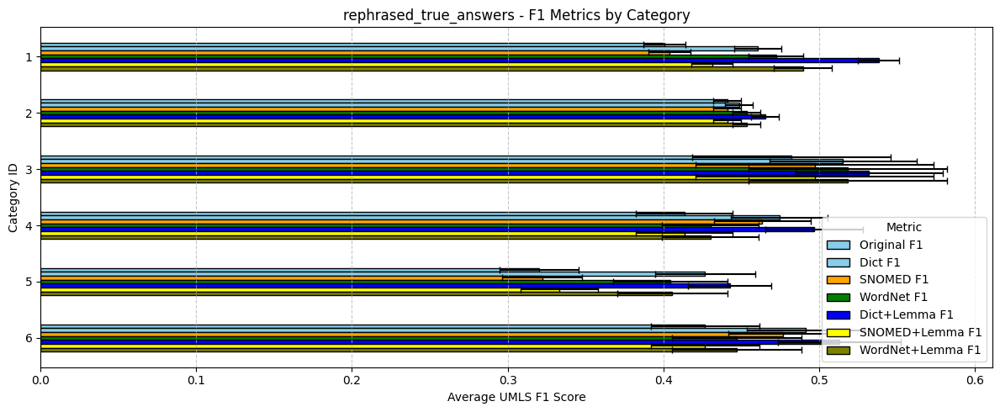

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1) Load data
df = pd.read_csv('.././deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_over_iterations.csv')

# 2) (Optional) Exclude categories you don't want
df = df[df['category_id'] != '3_MCQ']

# 3) Group by model & category => we want the 'mean' columns (and 'std' columns)
grouped = df.groupby(['model', 'category_id']).agg({
    'f1_score_mean': 'mean',
    'f1_score_std': 'mean',

    # Dictionary expansions
    'synonyms_f1_dict_mean': 'mean',
    'synonyms_f1_dict_std': 'mean',
    # SNOMED expansions
    'synonyms_f1_snomed_mean': 'mean',
    'synonyms_f1_snomed_std': 'mean',
    # WordNet expansions
    'synonyms_f1_wn_mean': 'mean',
    'synonyms_f1_wn_std': 'mean',

    # Lemmatized Dictionary expansions
    'synonyms_lemmatized_f1_dict_mean': 'mean',
    'synonyms_lemmatized_f1_dict_std': 'mean',
    # Lemmatized SNOMED expansions
    'synonyms_lemmatized_f1_snomed_mean': 'mean',
    'synonyms_lemmatized_f1_snomed_std': 'mean',
    # Lemmatized WordNet expansions
    'synonyms_lemmatized_f1_wn_mean': 'mean',
    'synonyms_lemmatized_f1_wn_std': 'mean'
}).reset_index()

# 4) Extract unique models & categories
models = grouped['model'].unique()
categories = grouped['category_id'].unique()
index = np.arange(len(categories))

# 5) Define the metrics to plot.
metrics = [
    ('f1_score_mean', 'f1_score_std', 'Original F1',         'skyblue'),
    ('synonyms_f1_dict_mean', 'synonyms_f1_dict_std', 'Dict F1', 'skyblue'),
    ('synonyms_f1_snomed_mean', 'synonyms_f1_snomed_std', 'SNOMED F1', 'orange'),
    ('synonyms_f1_wn_mean', 'synonyms_f1_wn_std', 'WordNet F1', 'green'),
    ('synonyms_lemmatized_f1_dict_mean', 'synonyms_lemmatized_f1_dict_std', 'Dict+Lemma F1', 'blue'),
    ('synonyms_lemmatized_f1_snomed_mean', 'synonyms_lemmatized_f1_snomed_std', 'SNOMED+Lemma F1', 'yellow'),
    ('synonyms_lemmatized_f1_wn_mean', 'synonyms_lemmatized_f1_wn_std', 'WordNet+Lemma F1', 'olive')
]

# 6) Plotting parameters
bar_height = 0.07
num_metrics = len(metrics)
fig_height = len(models) * 5
fig, axes = plt.subplots(nrows=len(models), ncols=1, figsize=(12, fig_height))

if len(models) == 1:
    axes = [axes]

for ax, model in zip(axes, models):
    model_data = grouped[grouped['model'] == model].copy()
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()
    
    for i, (mean_col, std_col, label, color) in enumerate(metrics):
        offset = (i - (num_metrics - 1) / 2) * bar_height
        means = model_data[mean_col]
        stds = model_data[std_col]
        
        # Set the label for the first subplot only to avoid duplicate legends
        ax.barh(
            y=index + offset,
            width=means,
            xerr=stds,
            height=bar_height,
            align='center',
            color=color,
            edgecolor='black',
            capsize=3,
            label=label  # Always include the label here
        )

    ax.set_yticks(index)
    ax.set_yticklabels(categories)
    ax.invert_yaxis()
    ax.set_xlabel('Average UMLS F1 Score')
    ax.set_ylabel('Category ID')
    ax.set_title(f'{model} - F1 Metrics by Category')
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    ax.legend(loc='lower right', title='Metric')

plt.tight_layout()
plt.show()

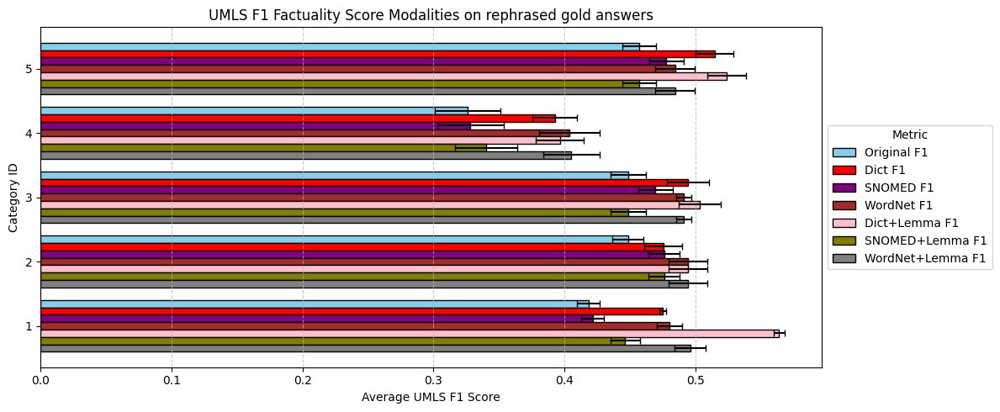

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1) Load data
df = pd.read_csv('.././deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')

# 2) (Optional) Exclude categories you don't want
df = df[df['category_id'] != 6]

# 3) Group by model & category => we want the 'mean' columns (and 'std' columns)
grouped = df.groupby(['model', 'category_id']).agg({
    'f1_score_iter_mean': 'mean',
    'f1_score_iter_std': 'mean',

    # Dictionary expansions
    'synonyms_f1_dict_iter_mean': 'mean',
    'synonyms_f1_dict_iter_std': 'mean',
    # SNOMED expansions
    'synonyms_f1_snomed_iter_mean': 'mean',
    'synonyms_f1_snomed_iter_std': 'mean',
    # WordNet expansions
    'synonyms_f1_wn_iter_mean': 'mean',
    'synonyms_f1_wn_iter_std': 'mean',

    # Lemmatized Dictionary expansions
    'synonyms_lemmatized_f1_dict_iter_mean': 'mean',
    'synonyms_lemmatized_f1_dict_iter_std': 'mean',
    # Lemmatized SNOMED expansions
    'synonyms_lemmatized_f1_snomed_iter_mean': 'mean',
    'synonyms_lemmatized_f1_snomed_iter_std': 'mean',
    # Lemmatized WordNet expansions
    'synonyms_lemmatized_f1_wn_iter_mean': 'mean',
    'synonyms_lemmatized_f1_wn_iter_std': 'mean'
}).reset_index()

# 4) Extract unique models & categories (Reversed Order)
models = grouped['model'].unique()
categories = sorted(grouped['category_id'].unique(), reverse=True)  # Reverse order
index = np.arange(len(categories))

# 5) Define the metrics to plot.

metrics = [
    ('f1_score_iter_mean', 'f1_score_iter_std', 'Original F1',         'deepskyblue'),  # Bright blue
    ('synonyms_f1_dict_iter_mean', 'synonyms_f1_dict_iter_std', 'Dict F1', 'darkorange'),  # Vibrant orange
    ('synonyms_f1_snomed_iter_mean', 'synonyms_f1_snomed_iter_std', 'SNOMED F1', 'forestgreen'),  # Deep green
    ('synonyms_f1_wn_iter_mean', 'synonyms_f1_wn_iter_std', 'WordNet F1', 'mediumblue'),  # Medium blue
    ('synonyms_lemmatized_f1_dict_iter_mean', 'synonyms_lemmatized_f1_dict_iter_std', 'Dict+Lemma F1', 'pink'),  # Golden orange
    ('synonyms_lemmatized_f1_snomed_iter_mean', 'synonyms_lemmatized_f1_snomed_iter_std', 'SNOMED+Lemma F1', 'limegreen'),  # Bright lime green
    ('synonyms_lemmatized_f1_wn_iter_mean', 'synonyms_lemmatized_f1_wn_iter_std', 'WordNet+Lemma F1', 'teal')  # Greenish-blue
]

metrics = [
    ('f1_score_iter_mean', 'f1_score_iter_std', 'Original F1',         'skyblue'),
    ('synonyms_f1_dict_iter_mean', 'synonyms_f1_dict_iter_std', 'Dict F1', 'red'),
    ('synonyms_f1_snomed_iter_mean', 'synonyms_f1_snomed_iter_std', 'SNOMED F1', 'purple'),
    ('synonyms_f1_wn_iter_mean', 'synonyms_f1_wn_iter_std', 'WordNet F1', 'brown'),
    ('synonyms_lemmatized_f1_dict_iter_mean', 'synonyms_lemmatized_f1_dict_iter_std', 'Dict+Lemma F1', 'pink'),
    ('synonyms_lemmatized_f1_snomed_iter_mean', 'synonyms_lemmatized_f1_snomed_iter_std', 'SNOMED+Lemma F1', 'olive'),
    ('synonyms_lemmatized_f1_wn_iter_mean', 'synonyms_lemmatized_f1_wn_iter_std', 'WordNet+Lemma F1', 'gray')
]



# 6) Plotting parameters
bar_height = 0.115
num_metrics = len(metrics)
fig_height = len(models) * 5
fig, axes = plt.subplots(nrows=len(models), ncols=1, figsize=(12, fig_height))

if len(models) == 1:
    axes = [axes]

for ax, model in zip(axes, models):
    model_data = grouped[grouped['model'] == model].copy()
    model_data = model_data.set_index('category_id').reindex(categories).reset_index()  # Ensure correct order

    for i, (mean_col, std_col, label, color) in enumerate(metrics):
        offset = (i - (num_metrics - 1) / 2) * bar_height
        means = model_data[mean_col]
        stds = model_data[std_col]
        
        ax.barh(
            y=index + offset,
            width=means,
            xerr=stds,
            height=bar_height,
            align='center',
            color=color,
            edgecolor='black',
            capsize=3,
            label=label
        )

    ax.set_yticks(index)
    ax.set_yticklabels(categories)
    ax.invert_yaxis()
    ax.set_xlabel('Average UMLS F1 Score')
    ax.set_ylabel('Category ID')
    ax.set_title(f'UMLS F1 Factuality Score Modalities on rephrased gold answers')
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    ax.legend(
    loc='center left',  # Position it to the left-center of the bounding box
    bbox_to_anchor=(1.0, 0.5),  # Place it outside the plot area (1.0 is far-right)
    title='Metric'
)

plt.tight_layout()
plt.savefig('F1_scores_comparison.jpg')
plt.show()

In [5]:
# 1) Load data
df = pd.read_csv('.././deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged_mean_over_questions.csv')

# 2) (Optional) Exclude categories you don't want
df = df[df['category_id'] != 6]

df

,nlp_model,model,category_id,precision_iter_mean,recall_iter_mean,f1_score_iter_mean,synonyms_precision_dict_iter_mean,synonyms_recall_dict_iter_mean,synonyms_f1_dict_iter_mean,synonyms_precision_snomed_iter_mean,...,GPT5_mean,GPT_overall_score_mean,GPT_overall_score_wo_Q4&5_mean,GPT1_std,GPT2_std,GPT3_std,GPT4_std,GPT5_std,GPT_overall_score_std,GPT_overall_score_wo_Q4&5_std
0,en_core_sci_lg,rephrased_true_answers,1,0.391109,0.454995,0.418432,0.435093,0.512785,0.467882,0.394379,...,5.000000,4.918182,4.863636,0.064282,0.000000,0.000000,0.0,0.0,0.012856,0.021427
1,en_core_sci_lg,rephrased_true_answers,2,0.443001,0.483101,0.460617,0.455745,0.497550,0.474121,0.470779,...,5.000000,4.900000,4.833333,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,en_core_sci_lg,rephrased_true_answers,3,0.428543,0.517778,0.463354,0.447412,0.540694,0.483955,0.456320,...,4.958333,4.779167,4.645833,0.000000,0.000000,0.029463,0.0,0.0,0.005893,0.009821
3,en_core_sci_lg,rephrased_true_answers,4,0.302060,0.341818,0.316464,0.385440,0.489001,0.418440,0.302060,...,5.000000,4.745455,4.575758,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,en_core_sci_lg,rephrased_true_answers,5,0.439204,0.511528,0.468007,0.462749,0.542083,0.494581,0.466982,...,4.958333,4.800000,4.680556,0.029463,0.029463,0.000000,0.0,0.0,0.011785,0.019642
5,en_core_sci_lg,rephrased_true_answers,6,0.365590,0.477637,0.405292,0.373282,0.485330,0.412984,0.365590,...,5.000000,4.710000,4.516667,0.000000,0.000000,0.070711,0.0,0.0,0.014142,0.023570


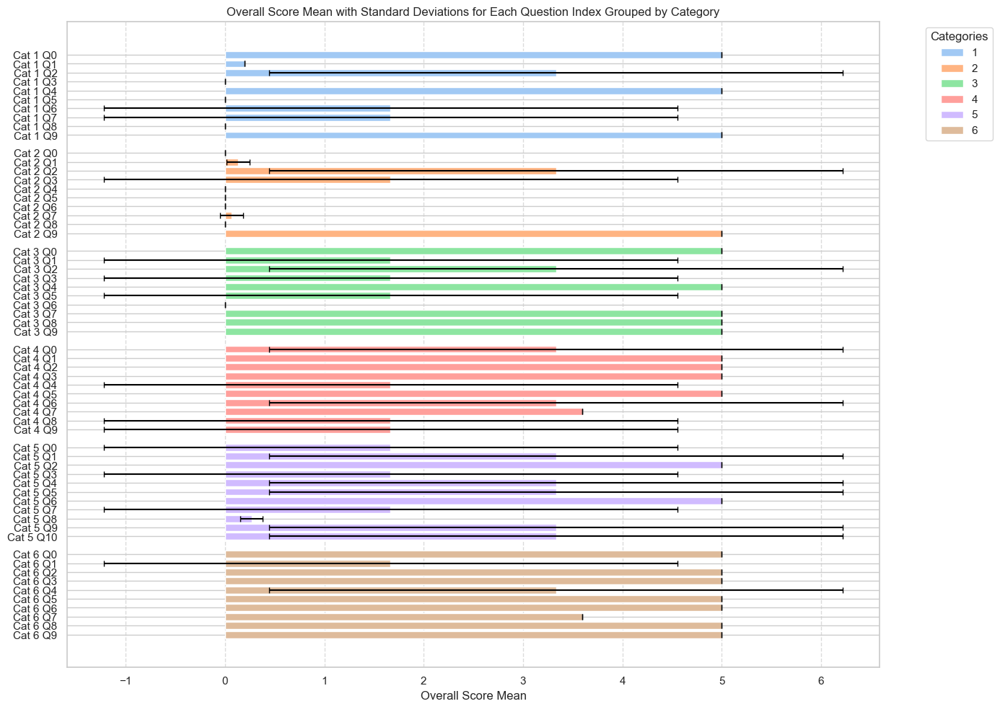

In [23]:
import seaborn as sns

# Set the seaborn style
sns.set(style='whitegrid')

df = pd.read_csv('../deploy_medical_llm_evaluation/gold_standard_rephrasing/rephrased-evaluation_results_merged.csv')
# Sort categories for consistent plotting
df = df.sort_values(['category_id', 'question_index'])

# Prepare data for plotting
plot_data = df.copy()

# Convert 'question_index' to integer for sorting
plot_data['question_index'] = plot_data['question_index'].astype(int)

# Create a new column combining category and question index for labeling
plot_data['Category_Question'] = 'Cat ' + plot_data['category_id'].astype(str) + ' Q' + plot_data['question_index'].astype(str)

# Reset index to ensure correct order
plot_data = plot_data.reset_index(drop=True)

# Map category IDs to integers for coloring
category_list = plot_data['category_id'].unique()
category_map = {category: idx for idx, category in enumerate(category_list)}
plot_data['category_idx'] = plot_data['category_id'].map(category_map)

# Add a new y position to introduce gaps between categories
plot_data['y_pos'] = 0

current_y = 0
gap_size = 1  # Adjust gap size as needed

for category in category_list:
    category_indices = plot_data[plot_data['category_id'] == category].index
    num_questions = len(category_indices)
    plot_data.loc[category_indices, 'y_pos'] = range(current_y, current_y + num_questions)
    current_y += num_questions + gap_size  # Add gap after each category

# Set up the plot
plt.figure(figsize=(14, 10))

# Create a color palette with as many colors as categories
palette = sns.color_palette('pastel', n_colors=len(category_list))

# Create the bar plot using matplotlib directly
ax = plt.gca()

# Plot bars manually to control positions and colors
for idx, row in plot_data.iterrows():
    ax.barh(
        y=row['y_pos'],
        width=row['GPT_overall_score_mean'],  # Use 'overall_score_mean' instead of 'mean_of_means'
        xerr=row['GPT_overall_score_std'],    # Use 'overall_score_std' instead of 'mean_of_stds'
        height=0.8,
        color=palette[row['category_idx']],
        capsize=3,
        error_kw={'ecolor': 'black'},
        label=row['category_id'] if idx == plot_data[plot_data['category_id'] == row['category_id']].index[0] else ""
    )

# Remove duplicate labels for legend
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

# Customize the plot
plt.title('Overall GPT Score Mean for Rephrased Answers with Standard Deviations for Each Question Index Grouped by Category')
plt.xlabel('Overall Score Mean')
# Remove y-axis label as labels are self-explanatory
plt.ylabel('')

# Set y-ticks and labels
plt.yticks(plot_data['y_pos'], plot_data['Category_Question'])

# Invert y-axis so that the first question appears on top
plt.gca().invert_yaxis()

# Show grid lines for clarity
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout to avoid overlap
plt.tight_layout()

# Display the plot
plt.show()

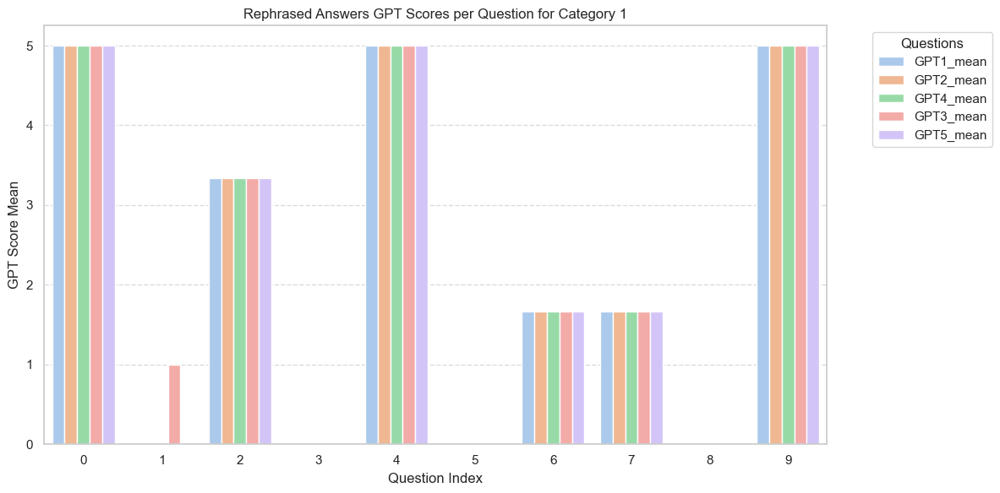

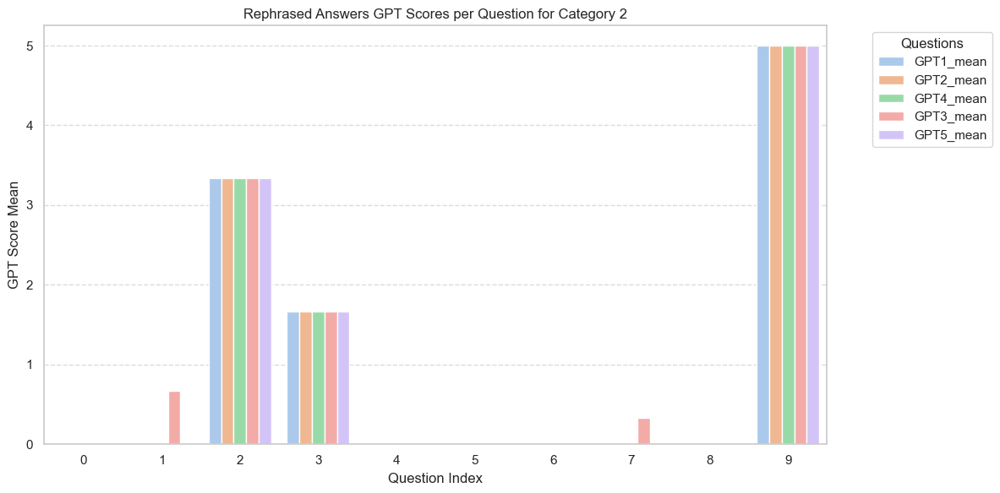

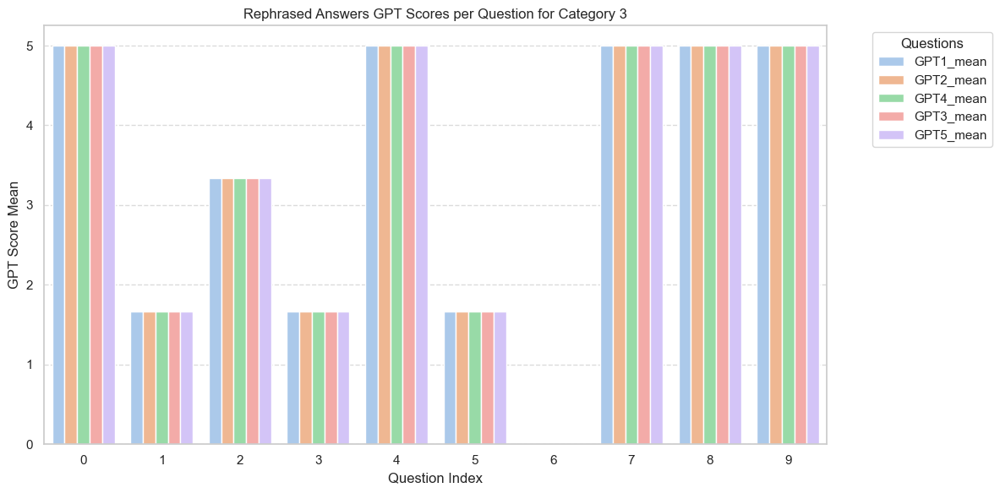

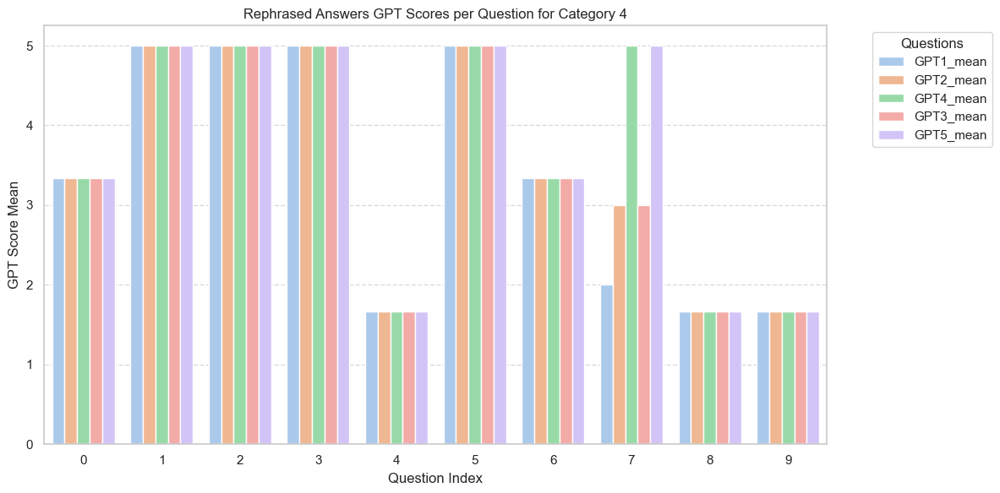

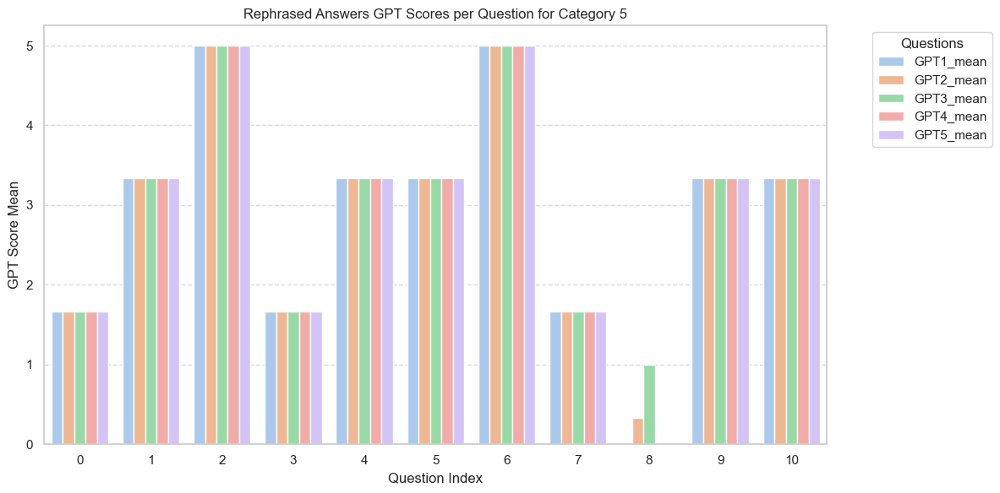

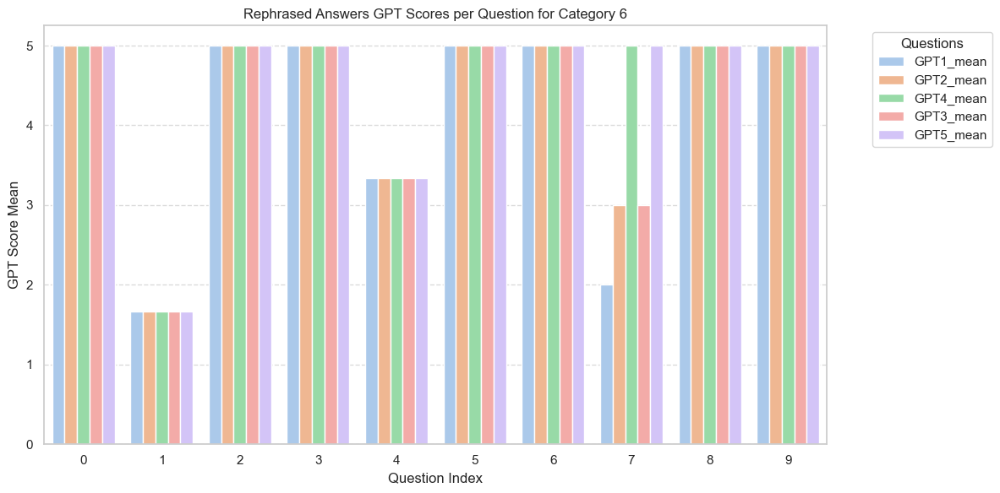

In [25]:
# Filter out the 'overall' rows
question_df = df[df['question_index'] != 'overall']

# Convert 'question_index' to integer for sorting
question_df['question_index'] = question_df['question_index'].astype(int)

# Prepare data for plotting
score_columns = ['GPT1_mean', 'GPT2_mean', 'GPT3_mean', 'GPT4_mean', 'GPT5_mean']
questions = ['GPT1', 'GPT2', 'GPT3', 'GPT4', 'GPT5']

# Loop over each category
for category in question_df['category_id'].unique():
    # Filter data for the category
    cat_df = question_df[question_df['category_id'] == category]
    
    # Melt the DataFrame to long format
    melted_df = pd.melt(
        cat_df,
        id_vars=['question_index'],
        value_vars=score_columns,
        var_name='Question',
        value_name='Score Mean'
    )
    
    # Sort data
    melted_df = melted_df.sort_values('question_index')
    
    # Set up the plot
    plt.figure(figsize=(12, 6))
    
    # Create grouped bar plot
    sns.barplot(
        data=melted_df,
        x='question_index',
        y='Score Mean',
        hue='Question',
        palette='pastel'
    )
    
    # Add labels and title
    plt.xlabel('Question Index')
    plt.ylabel('GPT Score Mean')
    plt.title(f'Rephrased Answers GPT Scores per Question for Category {category}')
    
    # Adjust legend
    plt.legend(title='Questions', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Show grid lines for clarity
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Display the plot
    plt.tight_layout()
    plt.show()

In [3]:
list = [n in range(1, 6)]
list

NameError: name 'n' is not defined